<a href="https://colab.research.google.com/github/RobertFlan02/Dietetics-FYP/blob/main/Dietetics-FYP/Experiments/U-Net/Experiment%201%2B2/U-NetExperiment1%2B2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Downloads

In [1]:
# Loads the kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [2]:
# Downaloads the segmenation dataset from Kaggle
!kaggle datasets download -d eather00/eduardopachecofoodseg103

Dataset URL: https://www.kaggle.com/datasets/eather00/eduardopachecofoodseg103
License(s): apache-2.0
 99% 1.15G/1.16G [00:09<00:00, 165MB/s]
100% 1.16G/1.16G [00:09<00:00, 132MB/s]


In [3]:
# Unzips the dataset
import zipfile
with zipfile.ZipFile('eduardopachecofoodseg103.zip', 'r') as zip_ref:
    zip_ref.extractall('foodseg103')

In [2]:
!pip install -q segmentation-models-pytorch albumentations

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 69.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Training Code

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


ID to Food Label Mapping: {1: 'candy', 2: 'egg tart', 3: 'french fries', 4: 'chocolate', 5: 'biscuit', 6: 'popcorn', 7: 'pudding', 8: 'ice cream', 9: 'cheese butter', 10: 'cake', 11: 'wine', 12: 'milkshake', 13: 'coffee', 14: 'juice', 15: 'milk', 16: 'tea', 17: 'almond', 18: 'red beans', 19: 'cashew', 20: 'dried cranberries', 21: 'soy', 22: 'walnut', 23: 'peanut', 24: 'egg', 25: 'apple', 26: 'date', 27: 'apricot', 28: 'avocado', 29: 'banana', 30: 'strawberry', 31: 'cherry', 32: 'blueberry', 33: 'raspberry', 34: 'mango', 35: 'olives', 36: 'peach', 37: 'lemon', 38: 'pear', 39: 'fig', 40: 'pineapple', 41: 'grape', 42: 'kiwi', 43: 'melon', 44: 'orange', 45: 'watermelon', 46: 'steak', 47: 'pork', 48: 'chicken duck', 49: 'sausage', 50: 'fried meat', 51: 'lamb', 52: 'sauce', 53: 'crab', 54: 'fish', 55: 'shellfish', 56: 'shrimp', 57: 'soup', 58: 'bread', 59: 'corn', 60: 'hamburg', 61: 'pizza', 62: 'hanamaki baozi', 63: 'wonton dumplings', 64: 'pasta', 65: 'noodles', 66: 'rice', 67: 'pie', 68: 

Counting pixels: 100%|██████████| 3986/3986 [01:57<00:00, 33.93it/s]


Class Weights (not used in Focal alpha): tensor([0.3801, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060,
        1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060,
        1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060,
        1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060,
        1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060,
        1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060,
        1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060,
        1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060,
        1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060,
        1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060,
        1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060, 1.0060,
        1.0060, 1.0060, 1.0060, 1.0060, 1.0060], device='cuda:0')


/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:58: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 327MB/s]


Epoch [1/30]


  Train - Loss: 2.1644, mIoU: 0.0377, Dice: 0.0132, Acc: 40.81%
  Val   - Loss: 0.3606, mIoU: 0.0675, Dice: 0.0260, Acc: 53.27%
  Best model saved.
Epoch [2/30]


  Train - Loss: 0.3441, mIoU: 0.0896, Dice: 0.0288, Acc: 54.29%
  Val   - Loss: 0.3198, mIoU: 0.0986, Dice: 0.0249, Acc: 55.64%
  Best model saved.
Epoch [3/30]


  Train - Loss: 0.3189, mIoU: 0.1234, Dice: 0.0280, Acc: 56.51%
  Val   - Loss: 0.3067, mIoU: 0.1341, Dice: 0.0292, Acc: 57.51%
  Best model saved.
Epoch [4/30]


  Train - Loss: 0.3052, mIoU: 0.1486, Dice: 0.0275, Acc: 58.08%
  Val   - Loss: 0.2942, mIoU: 0.1660, Dice: 0.0252, Acc: 59.76%
  Best model saved.
Epoch [5/30]


  Train - Loss: 0.2958, mIoU: 0.1704, Dice: 0.0284, Acc: 59.29%
  Val   - Loss: 0.2861, mIoU: 0.1839, Dice: 0.0322, Acc: 60.75%
  Best model saved.
Epoch [6/30]


  Train - Loss: 0.2871, mIoU: 0.1905, Dice: 0.0303, Acc: 60.32%
  Val   - Loss: 0.2812, mIoU: 0.2160, Dice: 0.0371, Acc: 62.51%
  Best model saved.
Epoch [7/30]


  Train - Loss: 0.2805, mIoU: 0.2156, Dice: 0.0321, Acc: 61.80%
  Val   - Loss: 0.2750, mIoU: 0.2328, Dice: 0.0380, Acc: 63.32%
  Best model saved.
Epoch [8/30]


  Train - Loss: 0.2745, mIoU: 0.2338, Dice: 0.0342, Acc: 62.93%
  Val   - Loss: 0.2693, mIoU: 0.2458, Dice: 0.0352, Acc: 64.06%
  Best model saved.
Epoch [9/30]


  Train - Loss: 0.2677, mIoU: 0.2557, Dice: 0.0371, Acc: 64.14%
  Val   - Loss: 0.2610, mIoU: 0.2617, Dice: 0.0390, Acc: 65.48%
  Best model saved.
Epoch [10/30]


  Train - Loss: 0.2610, mIoU: 0.2722, Dice: 0.0398, Acc: 65.04%
  Val   - Loss: 0.2520, mIoU: 0.2949, Dice: 0.0449, Acc: 67.23%
  Best model saved.
Epoch [11/30]


  Train - Loss: 0.2543, mIoU: 0.2873, Dice: 0.0428, Acc: 65.98%
  Val   - Loss: 0.2501, mIoU: 0.3090, Dice: 0.0464, Acc: 67.46%
  Best model saved.
Epoch [12/30]


  Train - Loss: 0.2488, mIoU: 0.3006, Dice: 0.0453, Acc: 66.96%
  Val   - Loss: 0.2422, mIoU: 0.3255, Dice: 0.0522, Acc: 68.85%
  Best model saved.
Epoch [13/30]


  Train - Loss: 0.2424, mIoU: 0.3163, Dice: 0.0483, Acc: 67.72%
  Val   - Loss: 0.2421, mIoU: 0.3194, Dice: 0.0492, Acc: 68.66%
  Best model saved.
Epoch [14/30]


  Train - Loss: 0.2369, mIoU: 0.3284, Dice: 0.0506, Acc: 68.45%
  Val   - Loss: 0.2395, mIoU: 0.3350, Dice: 0.0554, Acc: 69.06%
  Best model saved.
Epoch [15/30]


  Train - Loss: 0.2321, mIoU: 0.3403, Dice: 0.0535, Acc: 69.01%
  Val   - Loss: 0.2306, mIoU: 0.3480, Dice: 0.0580, Acc: 69.80%
  Best model saved.
Epoch [16/30]


  Train - Loss: 0.2265, mIoU: 0.3549, Dice: 0.0560, Acc: 69.84%
  Val   - Loss: 0.2288, mIoU: 0.3557, Dice: 0.0606, Acc: 70.14%
  Best model saved.
Epoch [17/30]


  Train - Loss: 0.2212, mIoU: 0.3663, Dice: 0.0592, Acc: 70.57%
  Val   - Loss: 0.2264, mIoU: 0.3692, Dice: 0.0626, Acc: 70.86%
  Best model saved.
Epoch [18/30]


  Train - Loss: 0.2171, mIoU: 0.3791, Dice: 0.0610, Acc: 71.20%
  Val   - Loss: 0.2253, mIoU: 0.3686, Dice: 0.0635, Acc: 70.97%
  Best model saved.
Epoch [19/30]


  Train - Loss: 0.2127, mIoU: 0.3899, Dice: 0.0636, Acc: 71.72%
  Val   - Loss: 0.2251, mIoU: 0.3787, Dice: 0.0676, Acc: 71.34%
  Best model saved.
Epoch [20/30]


  Train - Loss: 0.2083, mIoU: 0.3985, Dice: 0.0658, Acc: 72.38%
  Val   - Loss: 0.2227, mIoU: 0.3779, Dice: 0.0655, Acc: 71.42%
  Best model saved.
Epoch [21/30]


  Train - Loss: 0.2057, mIoU: 0.4061, Dice: 0.0669, Acc: 72.88%
  Val   - Loss: 0.2180, mIoU: 0.3921, Dice: 0.0684, Acc: 71.93%
  Best model saved.
Epoch [22/30]


  Train - Loss: 0.2011, mIoU: 0.4192, Dice: 0.0699, Acc: 73.42%
  Val   - Loss: 0.2184, mIoU: 0.3954, Dice: 0.0706, Acc: 72.34%
Epoch [23/30]


  Train - Loss: 0.1985, mIoU: 0.4289, Dice: 0.0711, Acc: 73.95%
  Val   - Loss: 0.2157, mIoU: 0.4008, Dice: 0.0723, Acc: 72.37%
  Best model saved.
Epoch [24/30]


  Train - Loss: 0.1956, mIoU: 0.4348, Dice: 0.0727, Acc: 74.46%
  Val   - Loss: 0.2144, mIoU: 0.4054, Dice: 0.0708, Acc: 72.67%
  Best model saved.
Epoch [25/30]


  Train - Loss: 0.1934, mIoU: 0.4390, Dice: 0.0749, Acc: 74.57%
  Val   - Loss: 0.2142, mIoU: 0.4068, Dice: 0.0715, Acc: 72.67%
  Best model saved.
Epoch [26/30]


  Train - Loss: 0.1914, mIoU: 0.4448, Dice: 0.0747, Acc: 74.98%
  Val   - Loss: 0.2146, mIoU: 0.4090, Dice: 0.0734, Acc: 72.82%
Epoch [27/30]


  Train - Loss: 0.1894, mIoU: 0.4480, Dice: 0.0759, Acc: 75.33%
  Val   - Loss: 0.2143, mIoU: 0.4107, Dice: 0.0719, Acc: 72.95%
Epoch [28/30]


  Train - Loss: 0.1887, mIoU: 0.4525, Dice: 0.0761, Acc: 75.50%
  Val   - Loss: 0.2154, mIoU: 0.4090, Dice: 0.0739, Acc: 72.88%
Epoch [29/30]


  Train - Loss: 0.1885, mIoU: 0.4524, Dice: 0.0764, Acc: 75.39%
  Val   - Loss: 0.2134, mIoU: 0.4122, Dice: 0.0741, Acc: 72.93%
  Best model saved.
Epoch [30/30]


  Train - Loss: 0.1874, mIoU: 0.4533, Dice: 0.0767, Acc: 75.61%
  Val   - Loss: 0.2132, mIoU: 0.4133, Dice: 0.0740, Acc: 73.03%
  Best model saved.
Training complete!


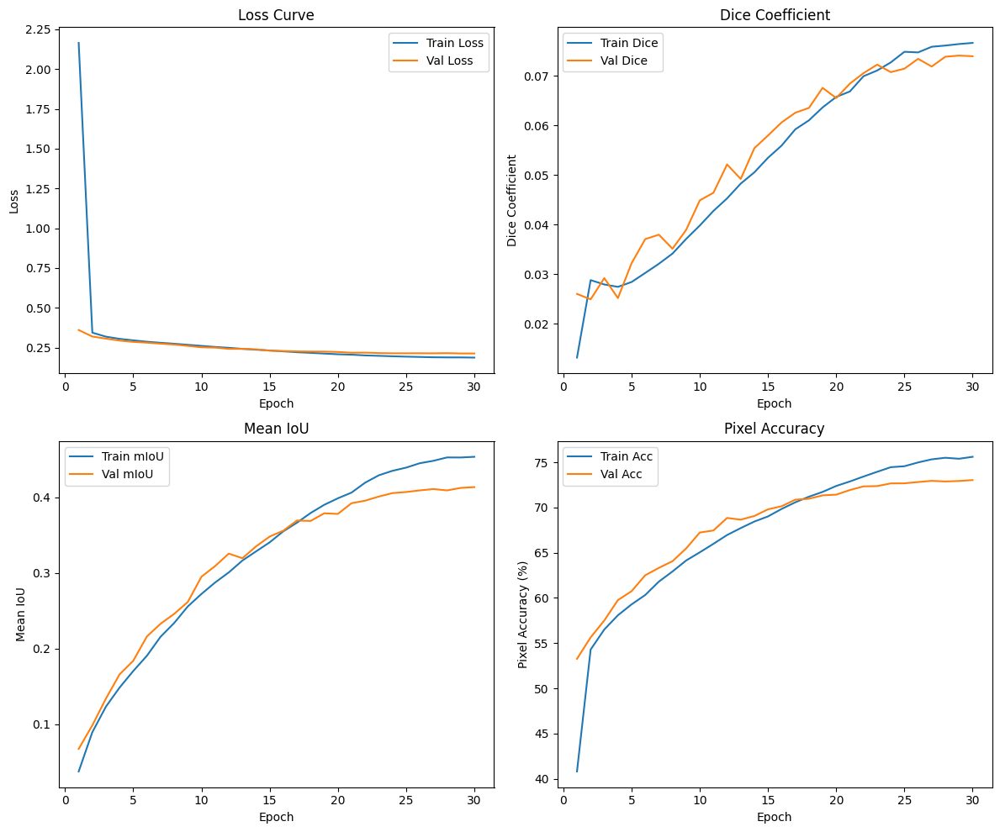

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Checkpoint downloaded.


In [ ]:
## MODEL 2 ##

import os
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
from PIL import Image
import io
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.amp import autocast, GradScaler
from torch.utils.data import Dataset, DataLoader

import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.model_selection import train_test_split

# -----------------------------
# 1. Hyperparameters & Settings
# -----------------------------
SEED = 42
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

HYPERPARAMS = {
    "num_classes": 104,        # (1 background + 103 foods)
    "lr": 1e-4,
    "weight_decay": 1e-5,
    "batch_size": 6,           # Adjust based on GPU memory
    "num_epochs": 30,          # Increase if training is still improving
    "image_size": 512,
    "max_grad_norm": 1.0,      # For gradient clipping
}

torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

# -----------------------------
# 2. Read Class Mappings
# -----------------------------
class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))
print("ID to Food Label Mapping:", id_to_food)

# -----------------------------
# 3. Load Parquet Files & Split Data
# -----------------------------
train_files = [
    '/content/foodseg103/train-00000-of-00003-6bb37ec387d1825a.parquet',
    '/content/foodseg103/train-00001-of-00003-4a1caa37147c0681.parquet',
    '/content/foodseg103/train-00002-of-00003-c8b698399244cd95.parquet'
]

dfs = [pd.read_parquet(f) for f in train_files]
full_df = pd.concat(dfs, ignore_index=True)
train_df, val_df = train_test_split(full_df, test_size=0.2, random_state=SEED)

print("Full dataset size:", len(full_df))
print("Train size:", len(train_df))
print("Val size:", len(val_df))

# -----------------------------
# 4. Simple Dataset for Pixel Counting (No Transforms)
# -----------------------------
class FoodSegCountingDataset(Dataset):
    def __init__(self, df):
        self.df = df

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        label_bytes = row['label']["bytes"]
        mask = Image.open(io.BytesIO(label_bytes))
        mask_tensor = torch.from_numpy(np.array(mask)).long()
        return mask_tensor

# -----------------------------
# 5. Count Pixels Dynamically
# -----------------------------
all_pixel_counts = np.zeros(HYPERPARAMS["num_classes"], dtype=np.float64)
counting_dataset = FoodSegCountingDataset(train_df)

print("Counting pixels for each class ...")
for idx in tqdm(range(len(counting_dataset)), desc="Counting pixels"):
    mask_tensor = counting_dataset[idx]
    mask_np = mask_tensor.numpy()
    unique_labels, counts = np.unique(mask_np, return_counts=True)
    for lbl, cnt in zip(unique_labels, counts):
        if 0 <= lbl < HYPERPARAMS["num_classes"]:
            all_pixel_counts[lbl] += cnt

# We won't feed this into focal_loss as alpha, but let's compute it
# in case you'd like to use it for something else, e.g. cross-entropy.
epsilon = 1e-6
total_pixels = all_pixel_counts.sum()
class_weights = total_pixels / (all_pixel_counts + epsilon)
class_weights = np.clip(class_weights, a_min=0.05, a_max=5.0)
class_weights = class_weights / class_weights.mean()
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(DEVICE)
print("Class Weights (not used in Focal alpha):", class_weights_tensor)

# -----------------------------
# 6. Albumentations Transforms
# -----------------------------
train_transform = A.Compose([
    A.Resize(HYPERPARAMS["image_size"], HYPERPARAMS["image_size"]),
    A.HorizontalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.07, scale_limit=0.1, rotate_limit=15, p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], is_check_shapes=False)

val_transform = A.Compose([
    A.Resize(HYPERPARAMS["image_size"], HYPERPARAMS["image_size"]),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], is_check_shapes=False)

# -----------------------------
# 7. Full Dataset & Dataloader
# -----------------------------
class FoodSegParquetDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_dict = row['image']
        label_dict = row['label']

        img = Image.open(io.BytesIO(image_dict["bytes"])).convert("RGB")
        mask = Image.open(io.BytesIO(label_dict["bytes"]))

        img_np = np.array(img)
        mask_np = np.array(mask, dtype=np.uint8)

        if self.transform is not None:
            augmented = self.transform(image=img_np, mask=mask_np)
            image_tensor = augmented['image']
            mask_tensor = augmented['mask']
        else:
            image_tensor = ToTensorV2()(image=img_np)['image']
            mask_tensor = torch.from_numpy(mask_np).long()

        return image_tensor, mask_tensor.long()

train_dataset = FoodSegParquetDataset(train_df, transform=train_transform)
val_dataset = FoodSegParquetDataset(val_df, transform=val_transform)

train_loader = DataLoader(train_dataset,
                          batch_size=HYPERPARAMS["batch_size"],
                          shuffle=True,
                          num_workers=2,
                          pin_memory=True)

val_loader = DataLoader(val_dataset,
                        batch_size=HYPERPARAMS["batch_size"],
                        shuffle=False,
                        num_workers=2,
                        pin_memory=True)

# -----------------------------
# 8. Model: U-Net w/ ResNet50
# -----------------------------
model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=HYPERPARAMS["num_classes"],
)
model.to(DEVICE)

# -----------------------------
# 9. Loss: Focal (scalar alpha=0.25) + Dice
#    We remove per-class alpha to fix dimension mismatch.
# -----------------------------
focal_loss = smp.losses.FocalLoss(
    mode='multiclass',
    alpha=0.25,  # single scalar
    gamma=2.0
)
dice_loss = smp.losses.DiceLoss(mode='multiclass')

def combined_loss(pred, target):
    # Weighted sum of Focal + Dice
    return focal_loss(pred, target) + 0.5 * dice_loss(pred, target)

# -----------------------------
# 10. Optimizer & Scheduler
# -----------------------------
optimizer = optim.AdamW(model.parameters(), lr=HYPERPARAMS["lr"], weight_decay=HYPERPARAMS["weight_decay"])
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=HYPERPARAMS["num_epochs"], eta_min=1e-6)

# -----------------------------
# 11. Metrics
# -----------------------------
def mean_iou_exclude_absent(pred, target, num_classes=HYPERPARAMS["num_classes"], eps=1e-6):
    pred_labels = torch.argmax(pred, dim=1)
    ious = []
    for cls in range(num_classes):
        target_cls = (target == cls)
        if target_cls.sum() == 0:
            continue
        pred_cls = (pred_labels == cls)
        intersection = (pred_cls & target_cls).float().sum()
        union = (pred_cls | target_cls).float().sum()
        ious.append((intersection + eps) / (union + eps))
    if len(ious) == 0:
        return 0.0
    return torch.stack(ious).mean().item()

def dice_exclude_absent(pred, target, smooth=1e-5, num_classes=HYPERPARAMS["num_classes"]):
    probs = F.softmax(pred, dim=1)
    target_onehot = F.one_hot(target, num_classes=num_classes).permute(0,3,1,2).float()
    dices = []
    for cls in range(num_classes):
        tgt_cls = target_onehot[:, cls, :, :]
        if tgt_cls.sum() == 0:
            continue
        prd_cls = probs[:, cls, :, :]
        intersection = (prd_cls * tgt_cls).sum(dim=(1,2))
        union = prd_cls.sum(dim=(1,2)) + tgt_cls.sum(dim=(1,2))
        dice_cls = (2. * intersection + smooth) / (union + smooth)
        dices.append(dice_cls)
    if len(dices) == 0:
        return 0.0
    return torch.cat(dices).mean().item()

def pixel_accuracy(pred, target):
    pred_labels = torch.argmax(pred, dim=1)
    correct = (pred_labels == target).float().sum()
    total = torch.numel(target)
    return (correct / total).item()

# -----------------------------
# 12. AMP & GradScaler
# -----------------------------
scaler = GradScaler()

# -----------------------------
# 13. Train & Validate
# -----------------------------
def train_one_epoch(model, loader, optimizer):
    model.train()
    running_loss = 0.0
    running_iou = 0.0
    running_dice = 0.0
    running_acc = 0.0
    n_samples = 0

    pbar = tqdm(loader, desc="Train", leave=False)
    for imgs, masks in pbar:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        optimizer.zero_grad()

        with autocast("cuda", enabled=(DEVICE == 'cuda')):
            outputs = model(imgs)
            loss = combined_loss(outputs, masks)

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), HYPERPARAMS["max_grad_norm"])
        scaler.step(optimizer)
        scaler.update()

        batch_size = imgs.size(0)
        running_loss += loss.item() * batch_size
        running_iou += mean_iou_exclude_absent(outputs, masks) * batch_size
        running_dice += dice_exclude_absent(outputs, masks) * batch_size
        running_acc += pixel_accuracy(outputs, masks) * batch_size

        n_samples += batch_size
        pbar.set_postfix({"loss": f"{loss.item():.4f}"})

    return (
        running_loss / n_samples,
        running_iou / n_samples,
        running_dice / n_samples,
        running_acc / n_samples
    )

def validate(model, loader):
    model.eval()
    running_loss = 0.0
    running_iou = 0.0
    running_dice = 0.0
    running_acc = 0.0
    n_samples = 0

    with torch.no_grad():
        pbar = tqdm(loader, desc="Val", leave=False)
        for imgs, masks in pbar:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)

            with autocast("cuda", enabled=(DEVICE == 'cuda')):
                outputs = model(imgs)
                loss = combined_loss(outputs, masks)

            batch_size = imgs.size(0)
            running_loss += loss.item() * batch_size
            running_iou += mean_iou_exclude_absent(outputs, masks) * batch_size
            running_dice += dice_exclude_absent(outputs, masks) * batch_size
            running_acc += pixel_accuracy(outputs, masks) * batch_size

            n_samples += batch_size
            pbar.set_postfix({"loss": f"{loss.item():.4f}"})

    return (
        running_loss / n_samples,
        running_iou / n_samples,
        running_dice / n_samples,
        running_acc / n_samples
    )

# -----------------------------
# 14. Main Training Loop
# -----------------------------
best_val_loss = float('inf')
history = {
    "train_loss": [],
    "train_iou": [],
    "train_dice": [],
    "train_acc": [],
    "val_loss": [],
    "val_iou": [],
    "val_dice": [],
    "val_acc": []
}

for epoch in range(HYPERPARAMS["num_epochs"]):
    print(f"Epoch [{epoch+1}/{HYPERPARAMS['num_epochs']}]")

    train_loss, train_iou, train_dice, train_acc = train_one_epoch(model, train_loader, optimizer)
    val_loss, val_iou, val_dice, val_acc = validate(model, val_loader)

    # Step the CosineAnnealingLR once per epoch
    scheduler.step()

    # Record
    history["train_loss"].append(train_loss)
    history["train_iou"].append(train_iou)
    history["train_dice"].append(train_dice)
    history["train_acc"].append(train_acc)
    history["val_loss"].append(val_loss)
    history["val_iou"].append(val_iou)
    history["val_dice"].append(val_dice)
    history["val_acc"].append(val_acc)

    print(f"  Train - Loss: {train_loss:.4f}, mIoU: {train_iou:.4f}, Dice: {train_dice:.4f}, Acc: {100*train_acc:.2f}%")
    print(f"  Val   - Loss: {val_loss:.4f}, mIoU: {val_iou:.4f}, Dice: {val_dice:.4f}, Acc: {100*val_acc:.2f}%")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        checkpoint = {
            "epoch": epoch + 1,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "best_val_loss": best_val_loss,
        }
        torch.save(checkpoint, "best_unet_checkpoint.pth")
        print("  Best model saved.")

print("Training complete!")

# -----------------------------
# 15. Plot Curves
# -----------------------------
epochs_range = range(1, HYPERPARAMS["num_epochs"] + 1)
plt.figure(figsize=(12, 10))

plt.subplot(2, 2, 1)
plt.plot(epochs_range, history["train_loss"], label='Train Loss')
plt.plot(epochs_range, history["val_loss"], label='Val Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")

plt.subplot(2, 2, 2)
plt.plot(epochs_range, history["train_dice"], label='Train Dice')
plt.plot(epochs_range, history["val_dice"], label='Val Dice')
plt.xlabel("Epoch")
plt.ylabel("Dice Coefficient")
plt.legend()
plt.title("Dice Coefficient")

plt.subplot(2, 2, 3)
plt.plot(epochs_range, history["train_iou"], label='Train mIoU')
plt.plot(epochs_range, history["val_iou"], label='Val mIoU')
plt.xlabel("Epoch")
plt.ylabel("Mean IoU")
plt.legend()
plt.title("Mean IoU")

plt.subplot(2, 2, 4)
plt.plot(epochs_range, [x*100 for x in history["train_acc"]], label='Train Acc')
plt.plot(epochs_range, [x*100 for x in history["val_acc"]], label='Val Acc')
plt.xlabel("Epoch")
plt.ylabel("Pixel Accuracy (%)")
plt.legend()
plt.title("Pixel Accuracy")

plt.tight_layout()
plt.show()

try:
    from google.colab import files
    files.download('best_unet_checkpoint.pth')
    print("Checkpoint downloaded.")
except ImportError:
    pass


Full training data shape: (4983, 2)
Training set shape: (3986, 2)
Test set shape: (997, 2)


/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:58: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


CSV Columns: Index(['Label', 'Label_Name', 'Images_Present', 'Pixel_Count'], dtype='object')
ID to Food Label Mapping: {1: 'candy', 2: 'egg tart', 3: 'french fries', 4: 'chocolate', 5: 'biscuit', 6: 'popcorn', 7: 'pudding', 8: 'ice cream', 9: 'cheese butter', 10: 'cake', 11: 'wine', 12: 'milkshake', 13: 'coffee', 14: 'juice', 15: 'milk', 16: 'tea', 17: 'almond', 18: 'red beans', 19: 'cashew', 20: 'dried cranberries', 21: 'soy', 22: 'walnut', 23: 'peanut', 24: 'egg', 25: 'apple', 26: 'date', 27: 'apricot', 28: 'avocado', 29: 'banana', 30: 'strawberry', 31: 'cherry', 32: 'blueberry', 33: 'raspberry', 34: 'mango', 35: 'olives', 36: 'peach', 37: 'lemon', 38: 'pear', 39: 'fig', 40: 'pineapple', 41: 'grape', 42: 'kiwi', 43: 'melon', 44: 'orange', 45: 'watermelon', 46: 'steak', 47: 'pork', 48: 'chicken duck', 49: 'sausage', 50: 'fried meat', 51: 'lamb', 52: 'sauce', 53: 'crab', 54: 'fish', 55: 'shellfish', 56: 'shrimp', 57: 'soup', 58: 'bread', 59: 'corn', 60: 'hamburg', 61: 'pizza', 62: 'han

Training:   0%|          | 0/167 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  Train - Loss: 5.0141, Dice: 0.0020, IoU: 0.0040, Pixel Acc: 0.78%, Food Acc: 3.73%
  Val   - Loss: 5.0136, Dice: 0.0025, IoU: 0.0045, Pixel Acc: 0.99%, Food Acc: 3.83%
  Model checkpoint saved.
Epoch [2/20]


  Train - Loss: 4.7533, Dice: 0.0026, IoU: 0.0083, Pixel Acc: 1.55%, Food Acc: 3.86%
  Val   - Loss: 4.5939, Dice: 0.0034, IoU: 0.0146, Pixel Acc: 2.79%, Food Acc: 4.21%
  Model checkpoint saved.
Epoch [3/20]


  Train - Loss: 4.4971, Dice: 0.0035, IoU: 0.0194, Pixel Acc: 3.21%, Food Acc: 4.12%
  Val   - Loss: 4.5136, Dice: 0.0046, IoU: 0.0177, Pixel Acc: 3.33%, Food Acc: 4.55%
  Model checkpoint saved.
Epoch [4/20]


  Train - Loss: 4.2919, Dice: 0.0046, IoU: 0.0248, Pixel Acc: 4.27%, Food Acc: 4.39%
  Val   - Loss: 4.1593, Dice: 0.0057, IoU: 0.0272, Pixel Acc: 7.12%, Food Acc: 4.90%
  Model checkpoint saved.
Epoch [5/20]


  Train - Loss: 4.1256, Dice: 0.0056, IoU: 0.0359, Pixel Acc: 14.04%, Food Acc: 4.85%
  Val   - Loss: 4.1533, Dice: 0.0064, IoU: 0.0375, Pixel Acc: 18.74%, Food Acc: 5.39%
  Model checkpoint saved.
Epoch [6/20]


  Train - Loss: 3.9589, Dice: 0.0064, IoU: 0.0441, Pixel Acc: 25.60%, Food Acc: 5.24%
  Val   - Loss: 4.0561, Dice: 0.0072, IoU: 0.0428, Pixel Acc: 24.24%, Food Acc: 5.37%
  Model checkpoint saved.
Epoch [7/20]


  Train - Loss: 3.8808, Dice: 0.0070, IoU: 0.0463, Pixel Acc: 28.45%, Food Acc: 5.32%
  Val   - Loss: 4.0147, Dice: 0.0074, IoU: 0.0502, Pixel Acc: 28.06%, Food Acc: 5.65%
  Model checkpoint saved.
Epoch [8/20]


  Train - Loss: 3.8006, Dice: 0.0077, IoU: 0.0530, Pixel Acc: 31.18%, Food Acc: 5.42%
  Val   - Loss: 3.9427, Dice: 0.0082, IoU: 0.0543, Pixel Acc: 30.39%, Food Acc: 5.84%
  Model checkpoint saved.
Epoch [9/20]


  Train - Loss: 3.6524, Dice: 0.0084, IoU: 0.0585, Pixel Acc: 32.25%, Food Acc: 5.63%
  Val   - Loss: 3.8279, Dice: 0.0090, IoU: 0.0650, Pixel Acc: 33.55%, Food Acc: 6.24%
  Model checkpoint saved.
Epoch [10/20]


  Train - Loss: 3.5652, Dice: 0.0090, IoU: 0.0648, Pixel Acc: 33.86%, Food Acc: 5.87%
  Val   - Loss: 3.9382, Dice: 0.0094, IoU: 0.0583, Pixel Acc: 29.77%, Food Acc: 6.06%
Epoch [11/20]


  Train - Loss: 3.5214, Dice: 0.0092, IoU: 0.0685, Pixel Acc: 34.70%, Food Acc: 6.00%
  Val   - Loss: 3.7640, Dice: 0.0099, IoU: 0.0716, Pixel Acc: 34.44%, Food Acc: 6.32%
  Model checkpoint saved.
Epoch [12/20]


  Train - Loss: 3.5049, Dice: 0.0098, IoU: 0.0721, Pixel Acc: 35.02%, Food Acc: 6.06%
  Val   - Loss: 3.8962, Dice: 0.0094, IoU: 0.0602, Pixel Acc: 31.81%, Food Acc: 6.80%
Epoch [13/20]


  Train - Loss: 3.4252, Dice: 0.0102, IoU: 0.0768, Pixel Acc: 35.39%, Food Acc: 6.39%
  Val   - Loss: 3.8274, Dice: 0.0107, IoU: 0.0784, Pixel Acc: 34.08%, Food Acc: 6.88%
Epoch [14/20]


  Train - Loss: 3.3165, Dice: 0.0111, IoU: 0.0877, Pixel Acc: 37.41%, Food Acc: 6.41%
  Val   - Loss: 3.7969, Dice: 0.0110, IoU: 0.0832, Pixel Acc: 38.07%, Food Acc: 6.73%
Epoch [15/20]


  Train - Loss: 3.2396, Dice: 0.0117, IoU: 0.0930, Pixel Acc: 37.74%, Food Acc: 6.44%
  Val   - Loss: 3.7645, Dice: 0.0119, IoU: 0.0873, Pixel Acc: 35.45%, Food Acc: 6.58%
Epoch [16/20]


  Train - Loss: 3.0673, Dice: 0.0126, IoU: 0.1044, Pixel Acc: 39.17%, Food Acc: 6.39%
  Val   - Loss: 3.5578, Dice: 0.0130, IoU: 0.0993, Pixel Acc: 37.50%, Food Acc: 6.81%
  Model checkpoint saved.
Epoch [17/20]


  Train - Loss: 2.9929, Dice: 0.0131, IoU: 0.1126, Pixel Acc: 39.89%, Food Acc: 6.60%
  Val   - Loss: 3.4897, Dice: 0.0134, IoU: 0.1060, Pixel Acc: 39.36%, Food Acc: 6.87%
  Model checkpoint saved.
Epoch [18/20]


  Train - Loss: 2.9010, Dice: 0.0137, IoU: 0.1202, Pixel Acc: 40.54%, Food Acc: 6.57%
  Val   - Loss: 3.5596, Dice: 0.0135, IoU: 0.1122, Pixel Acc: 39.05%, Food Acc: 7.06%
Epoch [19/20]


  Train - Loss: 2.8837, Dice: 0.0142, IoU: 0.1255, Pixel Acc: 40.89%, Food Acc: 6.48%
  Val   - Loss: 3.5458, Dice: 0.0142, IoU: 0.1152, Pixel Acc: 37.84%, Food Acc: 6.73%
Epoch [20/20]


  Train - Loss: 2.7788, Dice: 0.0146, IoU: 0.1339, Pixel Acc: 41.64%, Food Acc: 6.43%
  Val   - Loss: 3.5097, Dice: 0.0143, IoU: 0.1237, Pixel Acc: 40.33%, Food Acc: 6.70%


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Best checkpoint downloaded.


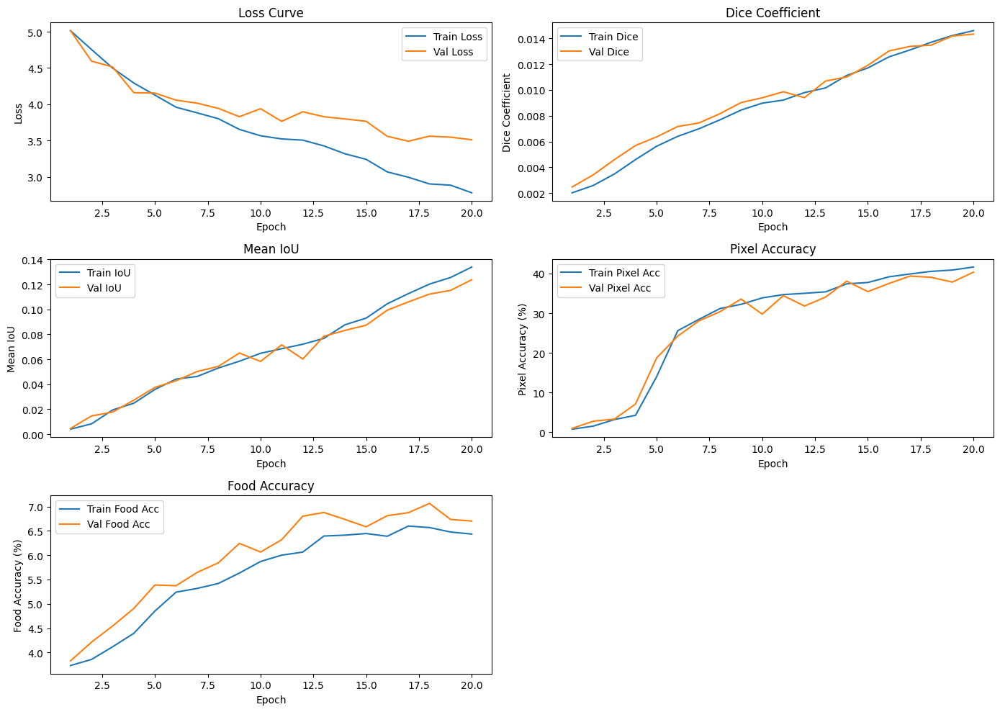

In [ ]:
## MODEL 1 ##

import random
import numpy as np
import torch
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import io
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# -----------------------------
# Hyperparameters & Settings
# -----------------------------
NUM_EPOCHS = 20               # Consider increasing this if training does not converge
BATCH_SIZE = 24               # Adjust based on available GPU memory
LEARNING_RATE = 0.0001         # For fine-tuning, you might try a lower LR (e.g., 1e-4)
WEIGHT_DECAY = 1e-5
IMAGE_SIZE = 256
NUM_CLASSES = 104   # 104 classes: background (0) + 103 food classes

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
RANDOM_SEED = 42
torch.manual_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)

# -----------------------------
# Load Parquet Files & Split Data
# -----------------------------
train_files = [
    '/content/foodseg103/train-00000-of-00003-6bb37ec387d1825a.parquet',
    '/content/foodseg103/train-00001-of-00003-4a1caa37147c0681.parquet',
    '/content/foodseg103/train-00002-of-00003-c8b698399244cd95.parquet'
]

train_dfs = [pd.read_parquet(f) for f in train_files]
full_train_df = pd.concat(train_dfs, ignore_index=True)
print("Full training data shape:", full_train_df.shape)

train_df, test_df = train_test_split(full_train_df, test_size=0.2, random_state=42)
print("Training set shape:", train_df.shape)
print("Test set shape:", test_df.shape)

# -----------------------------
# Define Joint Transform Wrapper for Albumentations
# -----------------------------
def joint_transform_wrapper(transform):
    def _transform(img, mask):
        img_np = np.array(img)
        mask_np = np.array(mask)
        augmented = transform(image=img_np, mask=mask_np)
        image_tensor = augmented['image']
        mask_tensor = augmented['mask']
        if not torch.is_tensor(mask_tensor):
            mask_tensor = torch.from_numpy(mask_tensor)
        return image_tensor, mask_tensor.long()
    return _transform

# -----------------------------
# Define Albumentations Transforms for Training & Validation
# Disable shape-checking to allow images and masks with different original sizes.
# -----------------------------
train_albu = A.Compose([
    A.Resize(IMAGE_SIZE, IMAGE_SIZE),
    A.HorizontalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=15, p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], is_check_shapes=False)

val_albu = A.Compose([
    A.Resize(IMAGE_SIZE, IMAGE_SIZE),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], is_check_shapes=False)

joint_train_transform = joint_transform_wrapper(train_albu)
joint_val_transform = joint_transform_wrapper(val_albu)

# -----------------------------
# Custom Dataset for Parquet Data (Images & Masks stored as bytes)
# -----------------------------
class FoodSegParquetDataset(Dataset):
    """
    Dataset that reads food segmentation samples from a DataFrame.
    Each row contains a dictionary for the image and a dictionary for the label,
    with the actual bytes stored under the "bytes" key.
    """
    def __init__(self, df, joint_transform=None, img_transform=None, mask_transform=None):
        self.df = df
        self.joint_transform = joint_transform
        self.img_transform = img_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_dict = row['image']
        img = Image.open(io.BytesIO(image_dict.get("bytes"))).convert("RGB")
        label_dict = row['label']
        mask = Image.open(io.BytesIO(label_dict.get("bytes")))

        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)
        else:
            img = ToTensorV2()(image=np.array(img))['image']
            mask = torch.from_numpy(np.array(mask)).long()

        if self.img_transform:
            img = self.img_transform(img)
        if self.mask_transform:
            mask = self.mask_transform(mask)

        if not torch.is_tensor(mask):
            mask = torch.from_numpy(np.array(mask)).long()
        else:
            mask = mask.long()

        # Ensure mask values are in [0, NUM_CLASSES-1]
        unique_vals = torch.unique(mask)
        if unique_vals.max() >= NUM_CLASSES or unique_vals.min() < 0:
            raise ValueError(f"Invalid mask values found: {unique_vals}. Ensure all labels are in [0, {NUM_CLASSES-1}].")
        return img, mask

train_dataset = FoodSegParquetDataset(train_df, joint_transform=joint_train_transform)
val_dataset = FoodSegParquetDataset(test_df, joint_transform=joint_val_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# -----------------------------
# Model Setup: U-Net with Pretrained Encoder
# -----------------------------
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",  # Entire network (backbone + decoder) is unfrozen
    in_channels=3,
    classes=NUM_CLASSES,
)
model.to(DEVICE)

# -----------------------------
# Class Weighting & Label Dictionary from CSV
# -----------------------------
df_label = pd.read_csv('train_label_stats.csv')
print("CSV Columns:", df_label.columns)

id_col = 'Label'
food_label_col = 'Label_Name'
pixel_count_col = 'Pixel_Count'

pixel_counts = df_label[pixel_count_col].values.astype(np.float32)
total_pixels = np.sum(pixel_counts)
class_frequencies = pixel_counts / total_pixels
median_frequency = np.median(class_frequencies)
weights_csv = median_frequency / class_frequencies  # computed for labels 1..103

# Set background weight explicitly to 0.00226
background_weight = 0.00226
weights = np.concatenate(([background_weight], weights_csv))  # now length 104

class_weights = torch.tensor(weights, dtype=torch.float32).to(DEVICE)

id_to_food = dict(zip(df_label[id_col], df_label[food_label_col]))
print("ID to Food Label Mapping:", id_to_food)

# -----------------------------
# Loss Function & Combined Loss
# -----------------------------
criterion_ce = nn.CrossEntropyLoss(weight=class_weights)
dice_loss = smp.losses.DiceLoss(mode='multiclass')

def combined_loss(pred, target):
    loss_ce = criterion_ce(pred, target)
    loss_dice = dice_loss(pred, target)
    return loss_ce + loss_dice

# -----------------------------
# Optimizer & Scheduler
# -----------------------------
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

# -----------------------------
# Metric Functions
# -----------------------------
# Mean IoU: for each class, if there are ground truth pixels, compute IoU; otherwise, skip that class.
def compute_mean_iou_exclude_absent(pred, target, num_classes=NUM_CLASSES, eps=1e-6):
    pred_labels = torch.argmax(pred, dim=1)
    ious = []
    for cls in range(num_classes):
        target_cls = (target == cls)
        if target_cls.sum() == 0:
            continue
        pred_cls = (pred_labels == cls)
        intersection = (pred_cls & target_cls).float().sum()
        union = (pred_cls | target_cls).float().sum()
        ious.append(((intersection + eps) / (union + eps)).item())
    if len(ious) == 0:
        return 0.0
    return np.mean(ious)

# Dice Coefficient: skip classes absent in ground truth
def dice_coef_exclude_absent(pred, target, smooth=1e-5, num_classes=NUM_CLASSES):
    pred = torch.softmax(pred, dim=1)
    target_onehot = nn.functional.one_hot(target, num_classes=num_classes).permute(0,3,1,2).float()
    dices = []
    for cls in range(num_classes):
        target_cls = target_onehot[:, cls, :, :]
        if target_cls.sum() == 0:
            continue
        pred_cls = pred[:, cls, :, :]
        intersection = (pred_cls * target_cls).sum(dim=(1,2))
        union = pred_cls.sum(dim=(1,2)) + target_cls.sum(dim=(1,2))
        dice_cls = (2. * intersection + smooth) / (union + smooth)
        dices.append(dice_cls)
    if len(dices) == 0:
        return 0.0
    dices = torch.stack(dices, dim=1)
    return dices.mean().item()

# Pixel Accuracy: calculated over all pixels (including background)
def compute_pixel_accuracy_all(pred, target):
    pred_labels = torch.argmax(pred, dim=1)
    correct = (pred_labels == target).float().sum()
    total = torch.numel(target)
    return (correct / total).item()

# Food Accuracy: excludes background (0) from sets
def compute_food_accuracy_exclude_background(pred, target):
    pred_labels = torch.argmax(pred, dim=1)
    batch_size = pred_labels.shape[0]
    food_acc = 0.0
    for i in range(batch_size):
        pred_set = set(pred_labels[i].cpu().numpy().flatten())
        target_set = set(target[i].cpu().numpy().flatten())
        pred_set.discard(0)
        target_set.discard(0)
        union = pred_set.union(target_set)
        if len(union) == 0:
            acc = 1.0
        else:
            intersection = pred_set.intersection(target_set)
            acc = len(intersection) / len(union)
        food_acc += acc
    return food_acc / batch_size

# -----------------------------
# Training & Validation Functions with Progress Bars and Iteration Loss Printing
# -----------------------------
def train_one_epoch(model, loader, optimizer):
    model.train()
    running_loss = 0.0
    running_dice = 0.0
    running_iou = 0.0
    running_pixel_acc = 0.0
    running_food_acc = 0.0

    pbar = tqdm(loader, desc="Training", leave=False)
    for images, masks in pbar:
        images = images.to(DEVICE)
        masks = masks.to(DEVICE)

        optimizer.zero_grad()
        outputs = model(images)
        loss = combined_loss(outputs, masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        running_dice += dice_coef_exclude_absent(outputs, masks) * images.size(0)
        running_iou += compute_mean_iou_exclude_absent(outputs, masks) * images.size(0)
        running_pixel_acc += compute_pixel_accuracy_all(outputs, masks) * images.size(0)
        running_food_acc += compute_food_accuracy_exclude_background(outputs, masks) * images.size(0)

        pbar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_loss = running_loss / len(loader.dataset)
    epoch_dice = running_dice / len(loader.dataset)
    epoch_iou = running_iou / len(loader.dataset)
    epoch_pixel_acc = running_pixel_acc / len(loader.dataset)
    epoch_food_acc = running_food_acc / len(loader.dataset)
    return epoch_loss, epoch_dice, epoch_iou, epoch_pixel_acc, epoch_food_acc

def validate(model, loader):
    model.eval()
    running_loss = 0.0
    running_dice = 0.0
    running_iou = 0.0
    running_pixel_acc = 0.0
    running_food_acc = 0.0

    with torch.no_grad():
        pbar = tqdm(loader, desc="Validation", leave=False)
        for images, masks in pbar:
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)

            outputs = model(images)
            loss = combined_loss(outputs, masks)
            running_loss += loss.item() * images.size(0)
            running_dice += dice_coef_exclude_absent(outputs, masks) * images.size(0)
            running_iou += compute_mean_iou_exclude_absent(outputs, masks) * images.size(0)
            running_pixel_acc += compute_pixel_accuracy_all(outputs, masks) * images.size(0)
            running_food_acc += compute_food_accuracy_exclude_background(outputs, masks) * images.size(0)

            pbar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_loss = running_loss / len(loader.dataset)
    epoch_dice = running_dice / len(loader.dataset)
    epoch_iou = running_iou / len(loader.dataset)
    epoch_pixel_acc = running_pixel_acc / len(loader.dataset)
    epoch_food_acc = running_food_acc / len(loader.dataset)
    return epoch_loss, epoch_dice, epoch_iou, epoch_pixel_acc, epoch_food_acc

# -----------------------------
# Main Training Loop & Metric Logging
# -----------------------------
best_val_loss = float('inf')
train_losses, train_dices, train_ious, train_pixel_accs, train_food_accs = [], [], [], [], []
val_losses, val_dices, val_ious, val_pixel_accs, val_food_accs = [], [], [], [], []

for epoch in range(NUM_EPOCHS):
    print(f"Epoch [{epoch+1}/{NUM_EPOCHS}]")
    train_loss, train_dice, train_iou, train_pixel_acc, train_food_acc = train_one_epoch(model, train_loader, optimizer)
    val_loss, val_dice, val_iou, val_pixel_acc, val_food_acc = validate(model, val_loader)

    scheduler.step(val_loss)

    train_losses.append(train_loss)
    train_dices.append(train_dice)
    train_ious.append(train_iou)
    train_pixel_accs.append(train_pixel_acc)
    train_food_accs.append(train_food_acc)

    val_losses.append(val_loss)
    val_dices.append(val_dice)
    val_ious.append(val_iou)
    val_pixel_accs.append(val_pixel_acc)
    val_food_accs.append(val_food_acc)

    print(f"  Train - Loss: {train_loss:.4f}, Dice: {train_dice:.4f}, IoU: {train_iou:.4f}, Pixel Acc: {train_pixel_acc*100:.2f}%, Food Acc: {train_food_acc*100:.2f}%")
    print(f"  Val   - Loss: {val_loss:.4f}, Dice: {val_dice:.4f}, IoU: {val_iou:.4f}, Pixel Acc: {val_pixel_acc*100:.2f}%, Food Acc: {val_food_acc*100:.2f}%")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), 'best_unet_model.pth')
        print("  Model checkpoint saved.")

try:
    from google.colab import files
    files.download('best_unet_model.pth')
    print("Best checkpoint downloaded.")
except ImportError:
    print("Not running in Google Colab; checkpoint not auto-downloaded.")

epochs_range = range(1, NUM_EPOCHS + 1)
plt.figure(figsize=(14, 10))

plt.subplot(3, 2, 1)
plt.plot(epochs_range, train_losses, label='Train Loss')
plt.plot(epochs_range, val_losses, label='Val Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve")

plt.subplot(3, 2, 2)
plt.plot(epochs_range, train_dices, label='Train Dice')
plt.plot(epochs_range, val_dices, label='Val Dice')
plt.xlabel("Epoch")
plt.ylabel("Dice Coefficient")
plt.legend()
plt.title("Dice Coefficient")

plt.subplot(3, 2, 3)
plt.plot(epochs_range, train_ious, label='Train IoU')
plt.plot(epochs_range, val_ious, label='Val IoU')
plt.xlabel("Epoch")
plt.ylabel("Mean IoU")
plt.legend()
plt.title("Mean IoU")

plt.subplot(3, 2, 4)
plt.plot(epochs_range, [acc * 100 for acc in train_pixel_accs], label='Train Pixel Acc')
plt.plot(epochs_range, [acc * 100 for acc in val_pixel_accs], label='Val Pixel Acc')
plt.xlabel("Epoch")
plt.ylabel("Pixel Accuracy (%)")
plt.legend()
plt.title("Pixel Accuracy")

plt.subplot(3, 2, 5)
plt.plot(epochs_range, [acc * 100 for acc in train_food_accs], label='Train Food Acc')
plt.plot(epochs_range, [acc * 100 for acc in val_food_accs], label='Val Food Acc')
plt.xlabel("Epoch")
plt.ylabel("Food Accuracy (%)")
plt.legend()
plt.title("Food Accuracy")

plt.tight_layout()
plt.show()


## Checkpoint loading

ID to Food Label Mapping: {1: 'candy', 2: 'egg tart', 3: 'french fries', 4: 'chocolate', 5: 'biscuit', 6: 'popcorn', 7: 'pudding', 8: 'ice cream', 9: 'cheese butter', 10: 'cake', 11: 'wine', 12: 'milkshake', 13: 'coffee', 14: 'juice', 15: 'milk', 16: 'tea', 17: 'almond', 18: 'red beans', 19: 'cashew', 20: 'dried cranberries', 21: 'soy', 22: 'walnut', 23: 'peanut', 24: 'egg', 25: 'apple', 26: 'date', 27: 'apricot', 28: 'avocado', 29: 'banana', 30: 'strawberry', 31: 'cherry', 32: 'blueberry', 33: 'raspberry', 34: 'mango', 35: 'olives', 36: 'peach', 37: 'lemon', 38: 'pear', 39: 'fig', 40: 'pineapple', 41: 'grape', 42: 'kiwi', 43: 'melon', 44: 'orange', 45: 'watermelon', 46: 'steak', 47: 'pork', 48: 'chicken duck', 49: 'sausage', 50: 'fried meat', 51: 'lamb', 52: 'sauce', 53: 'crab', 54: 'fish', 55: 'shellfish', 56: 'shrimp', 57: 'soup', 58: 'bread', 59: 'corn', 60: 'hamburg', 61: 'pizza', 62: 'hanamaki baozi', 63: 'wonton dumplings', 64: 'pasta', 65: 'noodles', 66: 'rice', 67: 'pie', 68: 

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:58: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
<ipython-input-3-e33274a157f9>:294: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where


Resuming from epoch 30 with best_val_loss=0.2132
Epoch [31/50]


  Train - Loss: 0.1878, mIoU: 0.4526, Dice: 0.0772, Acc: 75.49%
  Val   - Loss: 0.2139, mIoU: 0.4132, Dice: 0.0737, Acc: 73.06%
Epoch [32/50]


  Train - Loss: 0.1877, mIoU: 0.4544, Dice: 0.0768, Acc: 75.70%
  Val   - Loss: 0.2141, mIoU: 0.4124, Dice: 0.0729, Acc: 72.92%
Epoch [33/50]


  Train - Loss: 0.1869, mIoU: 0.4556, Dice: 0.0774, Acc: 75.73%
  Val   - Loss: 0.2136, mIoU: 0.4129, Dice: 0.0750, Acc: 72.94%
Epoch [34/50]


  Train - Loss: 0.1872, mIoU: 0.4540, Dice: 0.0773, Acc: 75.63%
  Val   - Loss: 0.2143, mIoU: 0.4123, Dice: 0.0740, Acc: 73.05%
Epoch [35/50]


  Train - Loss: 0.1867, mIoU: 0.4561, Dice: 0.0773, Acc: 75.76%
  Val   - Loss: 0.2133, mIoU: 0.4142, Dice: 0.0755, Acc: 73.11%
Epoch [36/50]


  Train - Loss: 0.1867, mIoU: 0.4556, Dice: 0.0782, Acc: 75.55%
  Val   - Loss: 0.2141, mIoU: 0.4120, Dice: 0.0772, Acc: 72.94%
Epoch [37/50]


  Train - Loss: 0.1869, mIoU: 0.4591, Dice: 0.0786, Acc: 75.63%
  Val   - Loss: 0.2142, mIoU: 0.4150, Dice: 0.0749, Acc: 73.03%
Epoch [38/50]


  Train - Loss: 0.1869, mIoU: 0.4582, Dice: 0.0784, Acc: 75.70%
  Val   - Loss: 0.2157, mIoU: 0.4148, Dice: 0.0769, Acc: 73.06%
Epoch [39/50]


  Train - Loss: 0.1863, mIoU: 0.4589, Dice: 0.0790, Acc: 75.72%
  Val   - Loss: 0.2166, mIoU: 0.4154, Dice: 0.0757, Acc: 72.68%
Epoch [40/50]


  Train - Loss: 0.1859, mIoU: 0.4631, Dice: 0.0795, Acc: 75.78%
  Val   - Loss: 0.2162, mIoU: 0.4158, Dice: 0.0772, Acc: 73.08%
Epoch [41/50]


  Train - Loss: 0.1860, mIoU: 0.4614, Dice: 0.0803, Acc: 75.77%
  Val   - Loss: 0.2196, mIoU: 0.4163, Dice: 0.0743, Acc: 72.79%
Epoch [42/50]


  Train - Loss: 0.1865, mIoU: 0.4610, Dice: 0.0802, Acc: 75.82%
  Val   - Loss: 0.2187, mIoU: 0.4173, Dice: 0.0769, Acc: 72.81%
Epoch [43/50]


  Train - Loss: 0.1864, mIoU: 0.4615, Dice: 0.0811, Acc: 75.66%
  Val   - Loss: 0.2176, mIoU: 0.4159, Dice: 0.0752, Acc: 72.85%
Epoch [44/50]


  Train - Loss: 0.1867, mIoU: 0.4642, Dice: 0.0808, Acc: 75.83%
  Val   - Loss: 0.2291, mIoU: 0.4113, Dice: 0.0782, Acc: 72.36%
Epoch [45/50]


  Train - Loss: 0.1875, mIoU: 0.4607, Dice: 0.0815, Acc: 75.55%
  Val   - Loss: 0.2172, mIoU: 0.4162, Dice: 0.0761, Acc: 72.63%
Epoch [46/50]


  Train - Loss: 0.1879, mIoU: 0.4654, Dice: 0.0813, Acc: 75.63%
  Val   - Loss: 0.2172, mIoU: 0.4252, Dice: 0.0796, Acc: 73.03%
Epoch [47/50]


  Train - Loss: 0.1875, mIoU: 0.4675, Dice: 0.0825, Acc: 75.69%
  Val   - Loss: 0.2184, mIoU: 0.4234, Dice: 0.0785, Acc: 72.64%
Epoch [48/50]


  Train - Loss: 0.1879, mIoU: 0.4681, Dice: 0.0822, Acc: 75.72%
  Val   - Loss: 0.2208, mIoU: 0.4172, Dice: 0.0759, Acc: 72.71%
Epoch [49/50]


  Train - Loss: 0.1880, mIoU: 0.4700, Dice: 0.0823, Acc: 75.78%
  Val   - Loss: 0.2314, mIoU: 0.4134, Dice: 0.0798, Acc: 72.36%
Epoch [50/50]


  Train - Loss: 0.1887, mIoU: 0.4694, Dice: 0.0821, Acc: 75.72%
  Val   - Loss: 0.2210, mIoU: 0.4310, Dice: 0.0772, Acc: 73.25%
Resumed training complete!


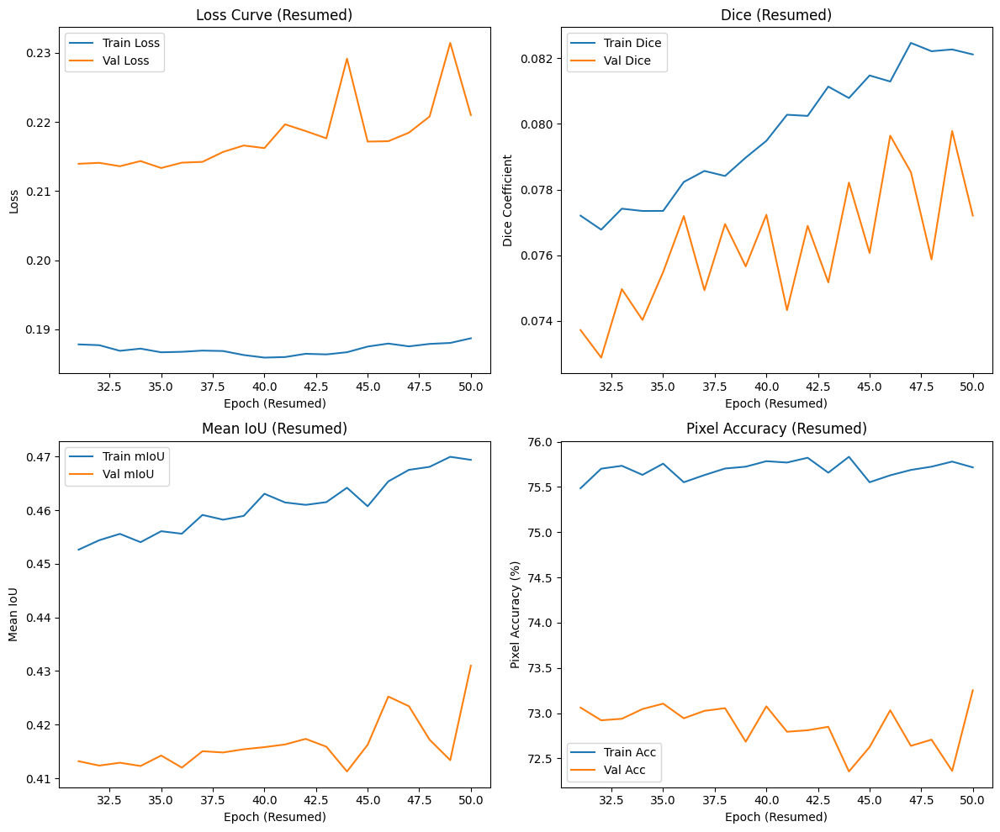

FileNotFoundError: Cannot find file: best_unet_checkpoint_resumed.pth

In [ ]:
import os
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
from PIL import Image
import io
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.amp import autocast, GradScaler
from torch.utils.data import Dataset, DataLoader

import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.model_selection import train_test_split

# -----------------------------
# 1. Hyperparameters & Settings
# -----------------------------
SEED = 42
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

HYPERPARAMS = {
    "num_classes": 104,      # (1 background + 103 foods)
    "lr": 1e-4,
    "weight_decay": 1e-5,
    "batch_size": 6,         # Adjust based on GPU memory
    "image_size": 512,
    "max_grad_norm": 1.0,    # For gradient clipping
}

# Decide how many additional epochs you want beyond the saved checkpoint
ADDITIONAL_EPOCHS = 20

torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

# -----------------------------
# 2. Read Class Mappings
# -----------------------------
class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))
print("ID to Food Label Mapping:", id_to_food)

# -----------------------------
# 3. Load Parquet Files & Split Data
# -----------------------------
train_files = [
    '/content/foodseg103/train-00000-of-00003-6bb37ec387d1825a.parquet',
    '/content/foodseg103/train-00001-of-00003-4a1caa37147c0681.parquet',
    '/content/foodseg103/train-00002-of-00003-c8b698399244cd95.parquet'
]

dfs = [pd.read_parquet(f) for f in train_files]
full_df = pd.concat(dfs, ignore_index=True)
train_df, val_df = train_test_split(full_df, test_size=0.2, random_state=SEED)

print("Full dataset size:", len(full_df))
print("Train size:", len(train_df))
print("Val size:", len(val_df))

# -----------------------------
# 4. (Optional) Pixel Counting
#    If you need class weighting for CE, etc.
# -----------------------------

# -----------------------------
# 5. Albumentations Transforms
#    We disable shape checks to avoid the Albumentations error
# -----------------------------
train_transform = A.Compose([
    A.Resize(512, 512),
    A.HorizontalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.07, scale_limit=0.1, rotate_limit=15, p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], is_check_shapes=False)

val_transform = A.Compose([
    A.Resize(512, 512),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], is_check_shapes=False)

# -----------------------------
# 6. Full Dataset & Dataloader
# -----------------------------
class FoodSegParquetDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_dict = row['image']
        label_dict = row['label']

        img = Image.open(io.BytesIO(image_dict["bytes"])).convert("RGB")
        mask = Image.open(io.BytesIO(label_dict["bytes"]))

        img_np = np.array(img)
        mask_np = np.array(mask, dtype=np.uint8)

        if self.transform is not None:
            augmented = self.transform(image=img_np, mask=mask_np)
            image_tensor = augmented['image']
            mask_tensor = augmented['mask']
            mask_tensor = mask_tensor.long()
        else:
            image_tensor = ToTensorV2()(image=img_np)['image']
            mask_tensor = torch.from_numpy(mask_np).long()

        return image_tensor, mask_tensor

train_dataset = FoodSegParquetDataset(train_df, transform=train_transform)
val_dataset = FoodSegParquetDataset(val_df, transform=val_transform)

train_loader = DataLoader(train_dataset,
                          batch_size=HYPERPARAMS["batch_size"],
                          shuffle=True,
                          num_workers=2,
                          pin_memory=True)

val_loader = DataLoader(val_dataset,
                        batch_size=HYPERPARAMS["batch_size"],
                        shuffle=False,
                        num_workers=2,
                        pin_memory=True)

# -----------------------------
# 7. Model: U-Net w/ ResNet50
# -----------------------------
model = smp.Unet(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=HYPERPARAMS["num_classes"],
)
model.to(DEVICE)

# -----------------------------
# 8. Loss: Focal + Dice
# -----------------------------
focal_loss = smp.losses.FocalLoss(
    mode='multiclass',
    alpha=0.25,
    gamma=2.0
)
dice_loss = smp.losses.DiceLoss(mode='multiclass')

def combined_loss(pred, target):
    return focal_loss(pred, target) + 0.5 * dice_loss(pred, target)

# -----------------------------
# 9. Optimizer & Scheduler
# -----------------------------
optimizer = optim.AdamW(model.parameters(), lr=HYPERPARAMS["lr"], weight_decay=HYPERPARAMS["weight_decay"])
# Must match the # of original epochs used for CosineAnnealing
ORIGINAL_NUM_EPOCHS = 30
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=ORIGINAL_NUM_EPOCHS, eta_min=1e-6)

# -----------------------------
# 10. Metrics
# -----------------------------
def mean_iou_exclude_absent(pred, target, num_classes=HYPERPARAMS["num_classes"], eps=1e-6):
    pred_labels = torch.argmax(pred, dim=1)
    ious = []
    for cls in range(num_classes):
        target_cls = (target == cls)
        if target_cls.sum() == 0:
            continue
        pred_cls = (pred_labels == cls)
        intersection = (pred_cls & target_cls).float().sum()
        union = (pred_cls | target_cls).float().sum()
        ious.append((intersection + eps) / (union + eps))
    if len(ious) == 0:
        return 0.0
    return torch.stack(ious).mean().item()

def dice_exclude_absent(pred, target, smooth=1e-5, num_classes=HYPERPARAMS["num_classes"]):
    probs = F.softmax(pred, dim=1)
    target_onehot = F.one_hot(target, num_classes=num_classes).permute(0,3,1,2).float()
    dices = []
    for cls in range(num_classes):
        tgt_cls = target_onehot[:, cls, :, :]
        if tgt_cls.sum() == 0:
            continue
        prd_cls = probs[:, cls, :, :]
        intersection = (prd_cls * tgt_cls).sum(dim=(1,2))
        union = prd_cls.sum(dim=(1,2)) + tgt_cls.sum(dim=(1,2))
        dice_cls = (2. * intersection + smooth) / (union + smooth)
        dices.append(dice_cls)
    if len(dices) == 0:
        return 0.0
    return torch.cat(dices).mean().item()

def pixel_accuracy(pred, target):
    pred_labels = torch.argmax(pred, dim=1)
    correct = (pred_labels == target).float().sum()
    total = torch.numel(target)
    return (correct / total).item()

scaler = GradScaler()

def train_one_epoch(model, loader, optimizer):
    model.train()
    running_loss = 0.0
    running_iou = 0.0
    running_dice = 0.0
    running_acc = 0.0
    n_samples = 0

    pbar = tqdm(loader, desc="Train", leave=False)
    for imgs, masks in pbar:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        optimizer.zero_grad()

        with autocast("cuda", enabled=(DEVICE == 'cuda')):
            outputs = model(imgs)
            loss = combined_loss(outputs, masks)

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), HYPERPARAMS["max_grad_norm"])
        scaler.step(optimizer)
        scaler.update()

        batch_size = imgs.size(0)
        running_loss += loss.item() * batch_size
        running_iou += mean_iou_exclude_absent(outputs, masks) * batch_size
        running_dice += dice_exclude_absent(outputs, masks) * batch_size
        running_acc += pixel_accuracy(outputs, masks) * batch_size

        n_samples += batch_size
        pbar.set_postfix({"loss": f"{loss.item():.4f}"})

    return (
        running_loss / n_samples,
        running_iou / n_samples,
        running_dice / n_samples,
        running_acc / n_samples
    )

def validate(model, loader):
    model.eval()
    running_loss = 0.0
    running_iou = 0.0
    running_dice = 0.0
    running_acc = 0.0
    n_samples = 0

    with torch.no_grad():
        pbar = tqdm(loader, desc="Val", leave=False)
        for imgs, masks in pbar:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)

            with autocast("cuda", enabled=(DEVICE == 'cuda')):
                outputs = model(imgs)
                loss = combined_loss(outputs, masks)

            batch_size = imgs.size(0)
            running_loss += loss.item() * batch_size
            running_iou += mean_iou_exclude_absent(outputs, masks) * batch_size
            running_dice += dice_exclude_absent(outputs, masks) * batch_size
            running_acc += pixel_accuracy(outputs, masks) * batch_size

            n_samples += batch_size
            pbar.set_postfix({"loss": f"{loss.item():.4f}"})

    return (
        running_loss / n_samples,
        running_iou / n_samples,
        running_dice / n_samples,
        running_acc / n_samples
    )

#######################
# 11. Load Checkpoint
#######################
checkpoint_path = "best_unet_checkpoint.pth"  # Make sure this file is present
checkpoint = torch.load(checkpoint_path, map_location=DEVICE)
model.load_state_dict(checkpoint["model_state_dict"])
optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
start_epoch = checkpoint["epoch"]      # The last epoch we trained
best_val_loss = checkpoint["best_val_loss"]
print(f"\nResuming from epoch {start_epoch} with best_val_loss={best_val_loss:.4f}")

#######################
# 12. Resume Training
#######################
history_resumed = {
    "train_loss": [],
    "val_loss": [],
    "train_iou": [],
    "val_iou": [],
    "train_dice": [],
    "val_dice": [],
    "train_acc": [],
    "val_acc": []
}

for epoch in range(start_epoch, start_epoch + ADDITIONAL_EPOCHS):
    print(f"Epoch [{epoch+1}/{start_epoch + ADDITIONAL_EPOCHS}]")

    train_loss, train_iou, train_dice, train_acc = train_one_epoch(model, train_loader, optimizer)
    val_loss, val_iou, val_dice, val_acc = validate(model, val_loader)

    scheduler.step()

    # Store metrics for new epochs
    history_resumed["train_loss"].append(train_loss)
    history_resumed["val_loss"].append(val_loss)
    history_resumed["train_iou"].append(train_iou)
    history_resumed["val_iou"].append(val_iou)
    history_resumed["train_dice"].append(train_dice)
    history_resumed["val_dice"].append(val_dice)
    history_resumed["train_acc"].append(train_acc)
    history_resumed["val_acc"].append(val_acc)

    print(f"  Train - Loss: {train_loss:.4f}, mIoU: {train_iou:.4f}, Dice: {train_dice:.4f}, Acc: {100*train_acc:.2f}%")
    print(f"  Val   - Loss: {val_loss:.4f}, mIoU: {val_iou:.4f}, Dice: {val_dice:.4f}, Acc: {100*val_acc:.2f}%")

    # If there's a new best val loss, save a new checkpoint
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        new_ckpt = {
            "epoch": epoch + 1,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "best_val_loss": best_val_loss,
        }
        torch.save(new_ckpt, "best_unet_checkpoint_resumed.pth")
        print("  New best model checkpoint saved.")

print("Resumed training complete!")

# 13. Plot the resumed curves
import matplotlib.pyplot as plt

epochs_range = range(start_epoch+1, start_epoch + ADDITIONAL_EPOCHS + 1)
plt.figure(figsize=(12, 10))

plt.subplot(2, 2, 1)
plt.plot(epochs_range, history_resumed["train_loss"], label='Train Loss')
plt.plot(epochs_range, history_resumed["val_loss"], label='Val Loss')
plt.xlabel("Epoch (Resumed)")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Curve (Resumed)")

plt.subplot(2, 2, 2)
plt.plot(epochs_range, history_resumed["train_dice"], label='Train Dice')
plt.plot(epochs_range, history_resumed["val_dice"], label='Val Dice')
plt.xlabel("Epoch (Resumed)")
plt.ylabel("Dice Coefficient")
plt.legend()
plt.title("Dice (Resumed)")

plt.subplot(2, 2, 3)
plt.plot(epochs_range, history_resumed["train_iou"], label='Train mIoU')
plt.plot(epochs_range, history_resumed["val_iou"], label='Val mIoU')
plt.xlabel("Epoch (Resumed)")
plt.ylabel("Mean IoU")
plt.legend()
plt.title("Mean IoU (Resumed)")

plt.subplot(2, 2, 4)
plt.plot(epochs_range, [x*100 for x in history_resumed["train_acc"]], label='Train Acc')
plt.plot(epochs_range, [x*100 for x in history_resumed["val_acc"]], label='Val Acc')
plt.xlabel("Epoch (Resumed)")
plt.ylabel("Pixel Accuracy (%)")
plt.legend()
plt.title("Pixel Accuracy (Resumed)")

plt.tight_layout()
plt.show()

# Optional: Download resumed checkpoint if in Colab
try:
    from google.colab import files
    files.download("best_unet_checkpoint_resumed.pth")
    print("Resumed checkpoint downloaded.")
except ImportError:
    pass


## Validation code


In [1]:
# Necessary install for CRF refinement

!pip install git+https://github.com/lucasb-eyer/pydensecrf.git

  Cloning https://github.com/lucasb-eyer/pydensecrf.git to /tmp/pip-req-build-3xntq55m
  Running command git clone --filter=blob:none --quiet https://github.com/lucasb-eyer/pydensecrf.git /tmp/pip-req-build-3xntq55m
  Resolved https://github.com/lucasb-eyer/pydensecrf.git to commit 2723c7fa4f2ead16ae1ce3d8afe977724bb8f87f
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pydensecrf: filename=pydensecrf-1.0-cp311-cp311-linux_x86_64.whl size=3440299 sha256=a46807a719fd4e25ecb9c39b7f648e7252256a49cb8a03e111ac3428ada50ef6
  Stored in directory: /tmp/pip-ephem-wheel-cache-8_liddy1/wheels/ce/8e/34/6dcfa200a9e2ae3627d8009b8bd1ca9b24512bec50a93304de
Successfully built pydensecrf


<ipython-input-7-f4f3855d853d>:48: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load("/content/foodseg103/best_unet_checkpoint.pth", map_location=device)

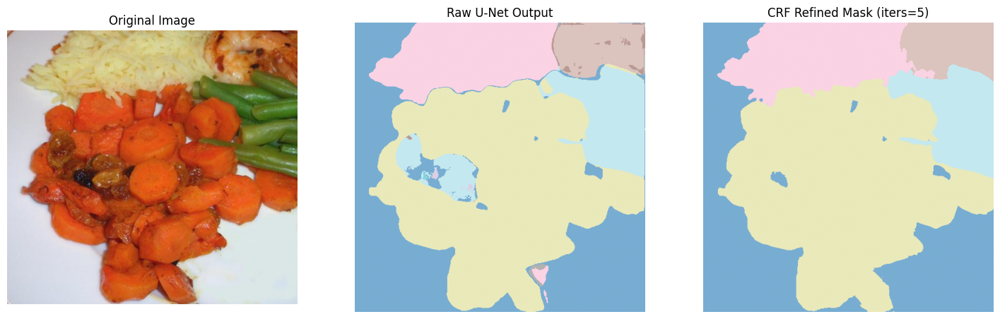

True food items:       ['French beans', 'rice', 'dried cranberries', 'carrot', 'shrimp']
Predicted food items:  ['French beans', 'rice', 'carrot', 'shrimp', 'pepper']
Food accuracy (set-based): 66.67%
Pixel Accuracy: 94.06%
Mean IoU:       77.80%
Mean Dice:      80.46%
Avg. Hausdorff: 34.22 pixels



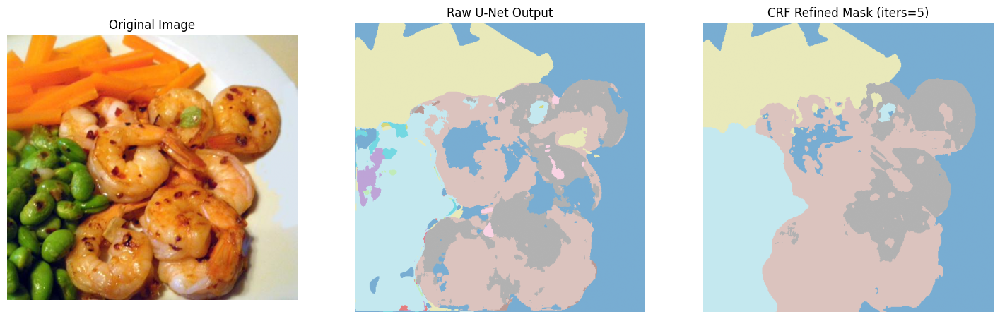

True food items:       ['shrimp', 'carrot', 'green beans']
Predicted food items:  ['french fries', 'potato', 'carrot', 'shrimp', 'onion', 'green beans']
Food accuracy (set-based): 50.00%
Pixel Accuracy: 81.28%
Mean IoU:       85.18%
Mean Dice:      91.29%
Avg. Hausdorff: 43.44 pixels



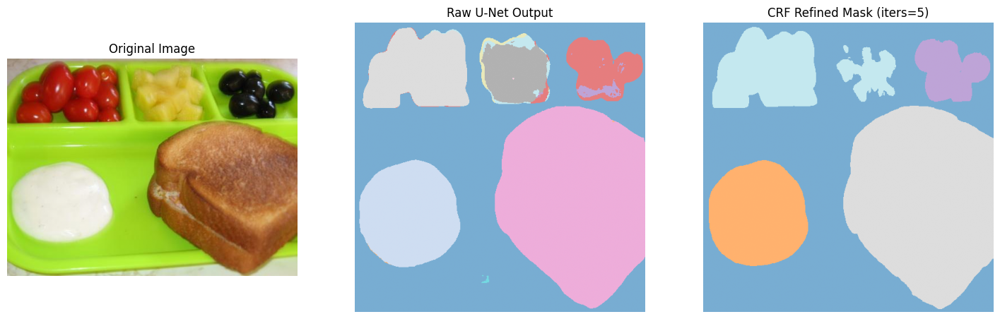

True food items:       ['olives', 'pineapple', 'tomato', 'sauce', 'bread']
Predicted food items:  ['blueberry', 'potato', 'ice cream', 'tomato', 'bread']
Food accuracy (set-based): 25.00%
Pixel Accuracy: 78.74%
Mean IoU:       47.28%
Mean Dice:      48.58%
Avg. Hausdorff: 5.67 pixels



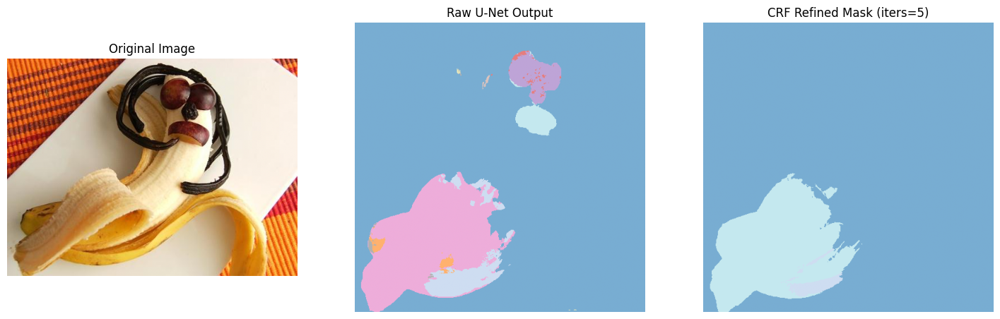

True food items:       ['grape', 'chocolate', 'banana']
Predicted food items:  ['bread', 'biscuit']
Food accuracy (set-based): 0.00%
Pixel Accuracy: 58.73%
Mean IoU:       17.16%
Mean Dice:      20.35%
Avg. Hausdorff: nan pixels



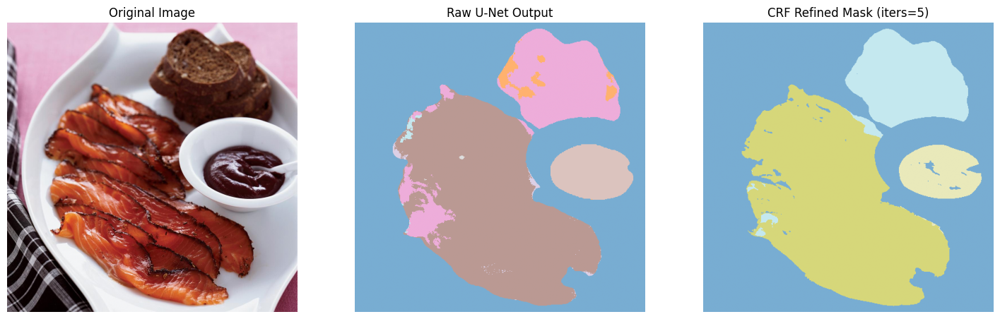

True food items:       ['bread', 'sauce', 'fish']
Predicted food items:  ['pork', 'chicken duck', 'sausage', 'sauce', 'shrimp', 'bread']
Food accuracy (set-based): 28.57%
Pixel Accuracy: 66.72%
Mean IoU:       70.62%
Mean Dice:      72.74%
Avg. Hausdorff: 47.16 pixels



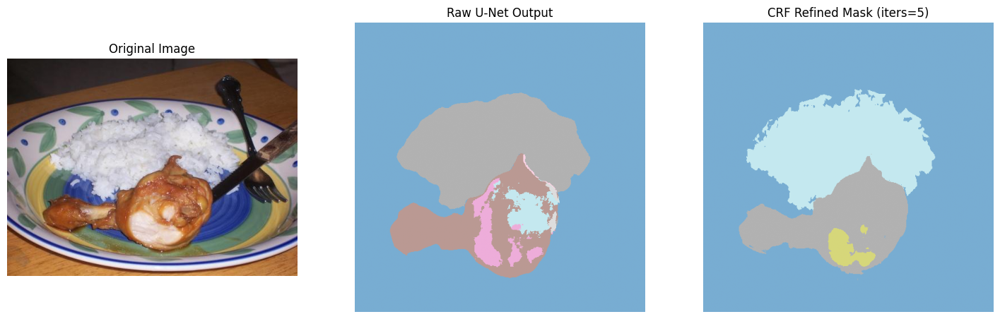

True food items:       ['chicken duck', 'rice']
Predicted food items:  ['chicken duck', 'shrimp', 'rice']
Food accuracy (set-based): 66.67%
Pixel Accuracy: 96.09%
Mean IoU:       89.21%
Mean Dice:      94.18%
Avg. Hausdorff: 18.10 pixels



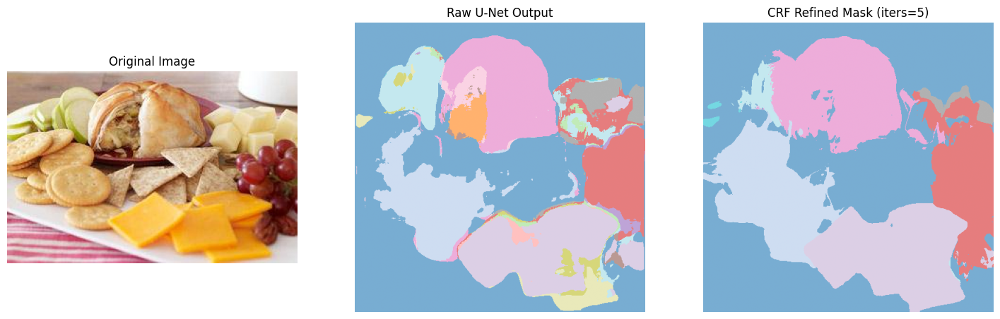

True food items:       ['biscuit', 'other ingredients', 'cheese butter', 'grape', 'apple', 'bread']
Predicted food items:  ['french fries', 'biscuit', 'potato', 'orange', 'steak', 'asparagus', 'bread', 'banana', 'pepper', 'cherry']
Food accuracy (set-based): 14.29%
Pixel Accuracy: 53.83%
Mean IoU:       30.29%
Mean Dice:      35.21%
Avg. Hausdorff: 149.62 pixels



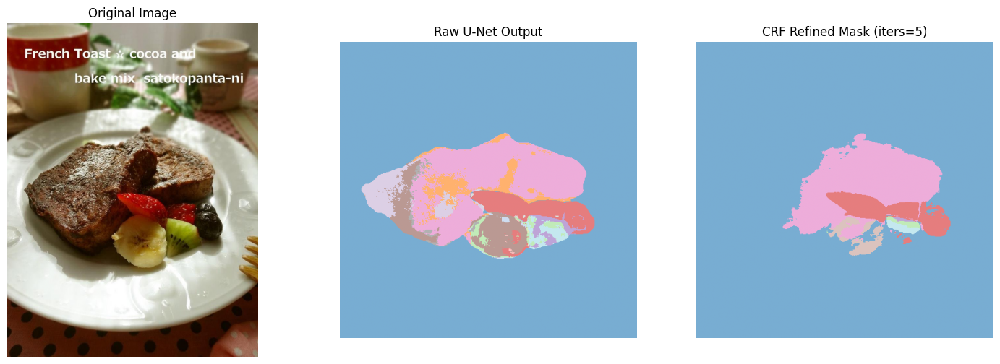

True food items:       ['blueberry', 'kiwi', 'bread', 'banana', 'strawberry']
Predicted food items:  ['blueberry', 'grape', 'sauce', 'pepper', 'egg', 'apple', 'bread', 'strawberry']
Food accuracy (set-based): 30.00%
Pixel Accuracy: 88.62%
Mean IoU:       49.32%
Mean Dice:      56.14%
Avg. Hausdorff: 62.08 pixels



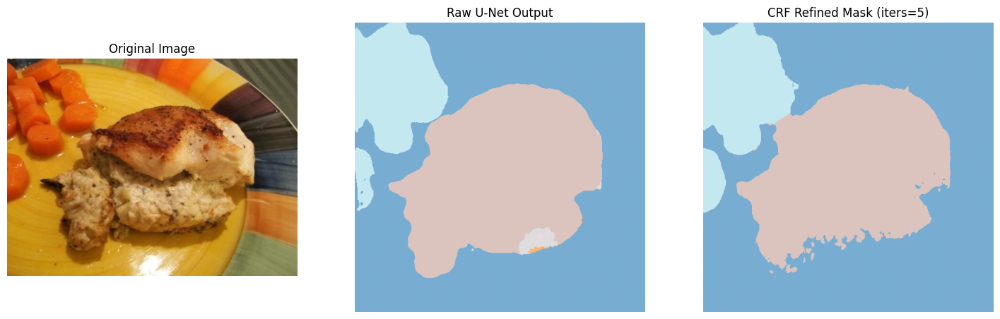

True food items:       ['chicken duck', 'carrot']
Predicted food items:  ['chicken duck', 'carrot']
Food accuracy (set-based): 100.00%
Pixel Accuracy: 95.07%
Mean IoU:       89.78%
Mean Dice:      94.61%
Avg. Hausdorff: 25.30 pixels



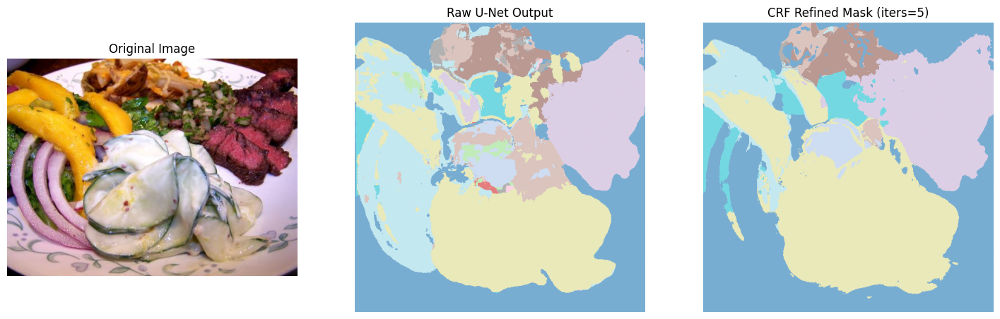

True food items:       ['shiitake', 'other ingredients', 'steak', 'cucumber', 'cilantro mint', 'onion']
Predicted food items:  ['potato', 'ice cream', 'orange', 'steak', 'chicken duck', 'lettuce', 'pumpkin', 'cucumber', 'sauce', 'carrot', 'shrimp', 'cilantro mint', 'onion', 'pepper']
Food accuracy (set-based): 25.00%
Pixel Accuracy: 63.34%
Mean IoU:       35.99%
Mean Dice:      43.29%
Avg. Hausdorff: 109.06 pixels



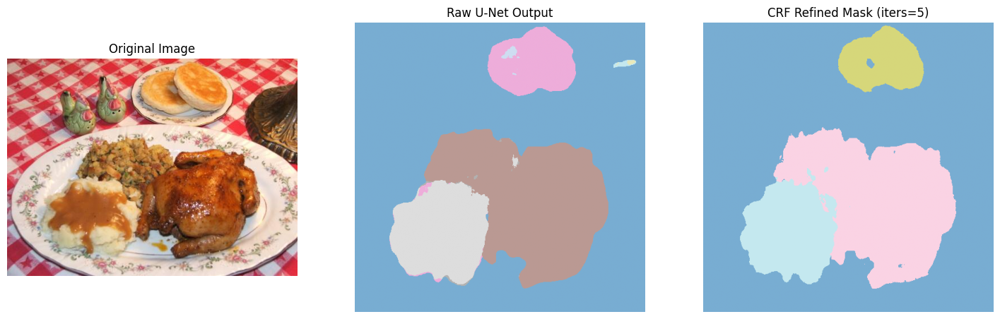

True food items:       ['chicken duck', 'pie', 'potato']
Predicted food items:  ['chicken duck', 'bread', 'potato']
Food accuracy (set-based): 50.00%
Pixel Accuracy: 92.79%
Mean IoU:       69.95%
Mean Dice:      72.36%
Avg. Hausdorff: 23.75 pixels



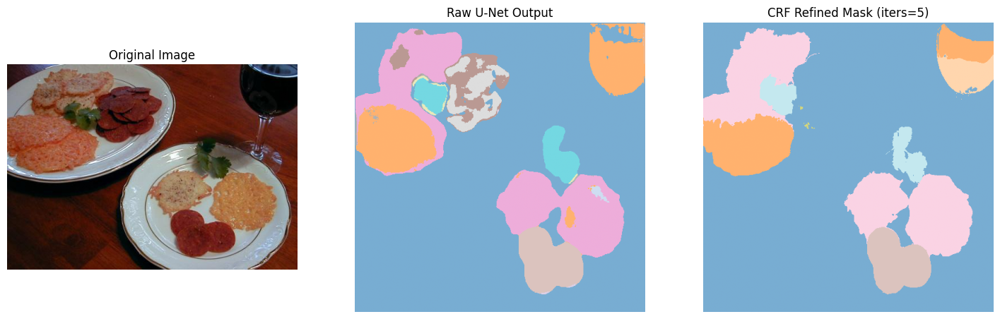

True food items:       ['wine', 'sausage', 'pie', 'cilantro mint']
Predicted food items:  ['tomato', 'cake', 'coffee', 'juice', 'sauce', 'cilantro mint', 'bread']
Food accuracy (set-based): 10.00%
Pixel Accuracy: 66.81%
Mean IoU:       34.00%
Mean Dice:      36.72%
Avg. Hausdorff: 12.65 pixels



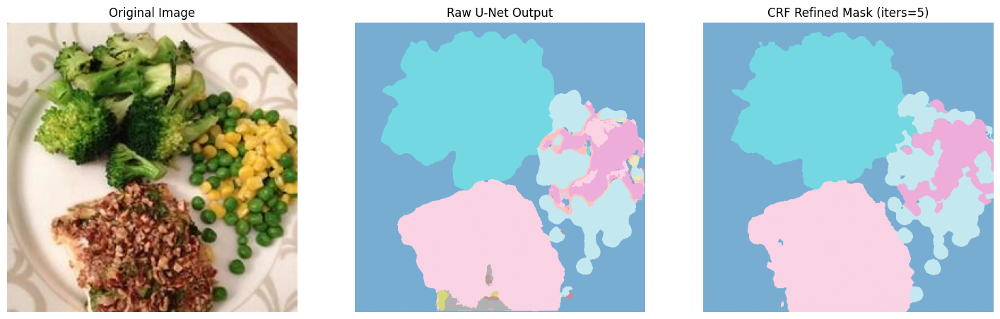

True food items:       ['corn', 'green beans', 'fish', 'broccoli']
Predicted food items:  ['rice', 'corn', 'green beans', 'broccoli']
Food accuracy (set-based): 60.00%
Pixel Accuracy: 76.00%
Mean IoU:       66.12%
Mean Dice:      72.09%
Avg. Hausdorff: 46.95 pixels



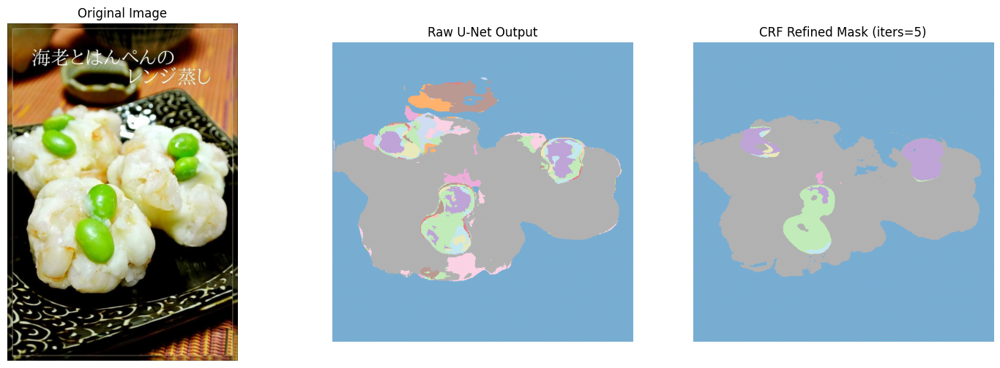

True food items:       ['shrimp', 'green beans']
Predicted food items:  ['potato', 'grape', 'cucumber', 'apple', 'bread', 'pepper']
Food accuracy (set-based): 0.00%
Pixel Accuracy: 62.05%
Mean IoU:       31.03%
Mean Dice:      32.14%
Avg. Hausdorff: nan pixels



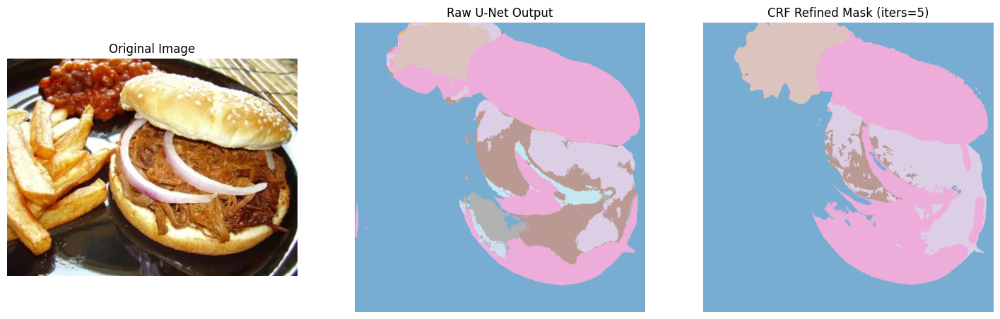

True food items:       ['french fries', 'steak', 'sauce', 'bread', 'onion']
Predicted food items:  ['french fries', 'steak', 'chicken duck', 'sauce', 'shrimp', 'bread', 'onion']
Food accuracy (set-based): 71.43%
Pixel Accuracy: 84.42%
Mean IoU:       66.24%
Mean Dice:      73.16%
Avg. Hausdorff: 115.57 pixels



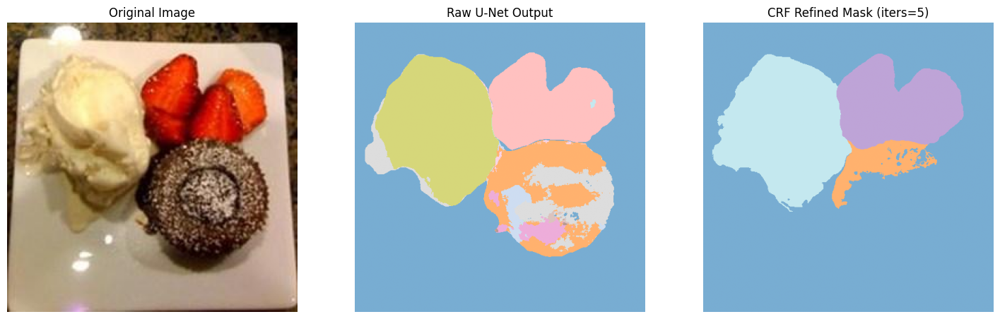

True food items:       ['ice cream', 'cake', 'strawberry']
Predicted food items:  ['cake', 'potato', 'strawberry']
Food accuracy (set-based): 50.00%
Pixel Accuracy: 68.64%
Mean IoU:       47.88%
Mean Dice:      54.43%
Avg. Hausdorff: 78.64 pixels



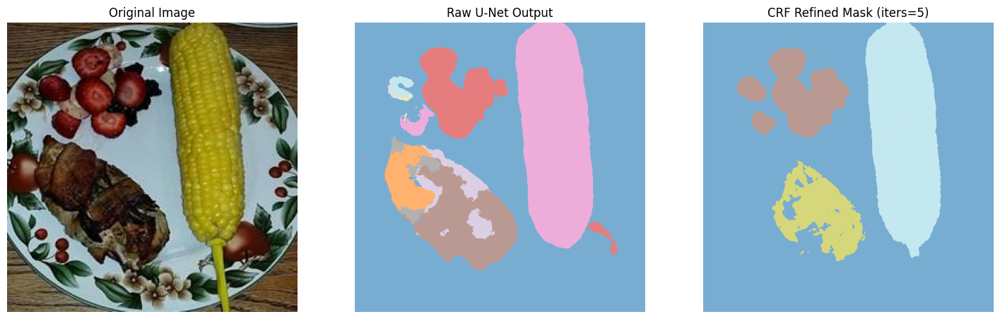

True food items:       ['raspberry', 'pork', 'chicken duck', 'corn', 'banana', 'strawberry']
Predicted food items:  ['chicken duck', 'corn', 'strawberry']
Food accuracy (set-based): 50.00%
Pixel Accuracy: 86.07%
Mean IoU:       41.15%
Mean Dice:      46.39%
Avg. Hausdorff: 53.20 pixels



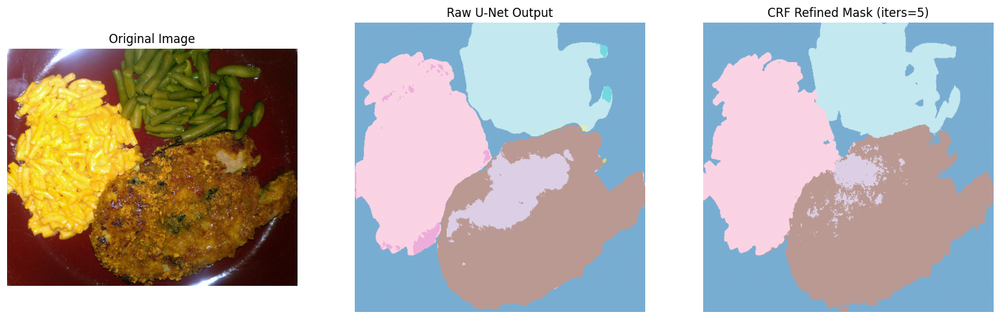

True food items:       ['pasta', 'French beans', 'pork']
Predicted food items:  ['French beans', 'noodles', 'rice', 'steak', 'chicken duck']
Food accuracy (set-based): 14.29%
Pixel Accuracy: 48.11%
Mean IoU:       48.15%
Mean Dice:      49.06%
Avg. Hausdorff: 10.63 pixels



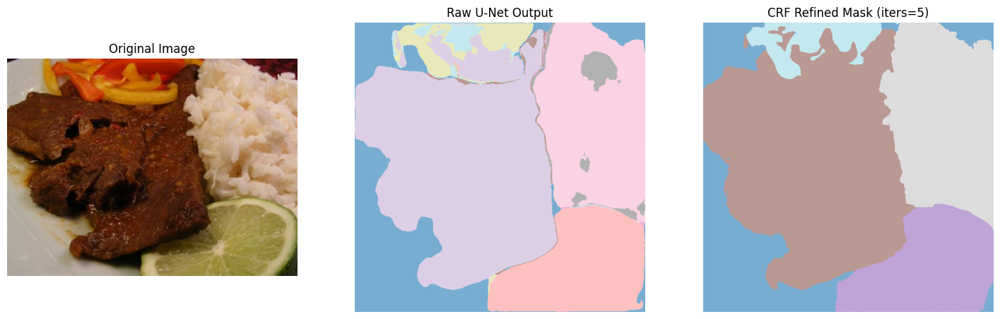

True food items:       ['chicken duck', 'rice', 'lemon', 'pepper']
Predicted food items:  ['rice', 'lemon', 'orange', 'steak', 'carrot']
Food accuracy (set-based): 28.57%
Pixel Accuracy: 49.68%
Mean IoU:       56.30%
Mean Dice:      58.06%
Avg. Hausdorff: 14.33 pixels



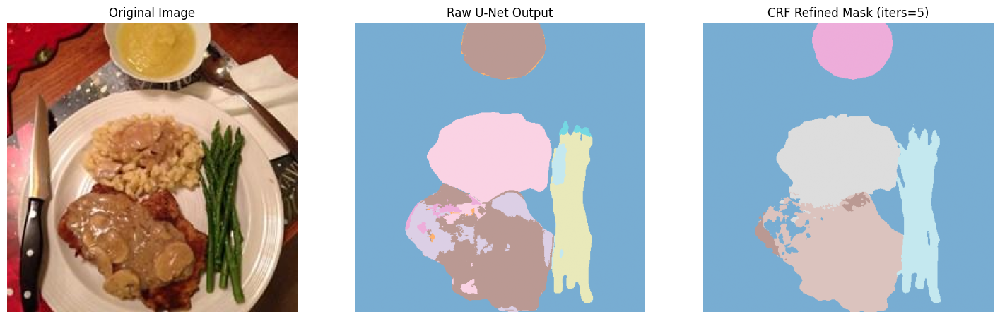

True food items:       ['white button mushroom', 'steak', 'sauce', 'asparagus', 'egg']
Predicted food items:  ['rice', 'steak', 'chicken duck', 'sauce', 'asparagus']
Food accuracy (set-based): 42.86%
Pixel Accuracy: 74.62%
Mean IoU:       47.90%
Mean Dice:      50.23%
Avg. Hausdorff: 65.87 pixels



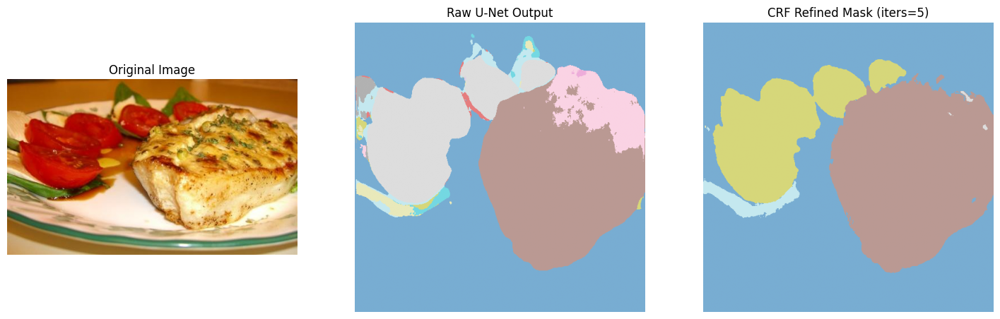

True food items:       ['tomato', 'cheese butter', 'fish', 'cilantro mint']
Predicted food items:  ['pie', 'tomato', 'chicken duck', 'lettuce', 'asparagus', 'cilantro mint']
Food accuracy (set-based): 25.00%
Pixel Accuracy: 63.10%
Mean IoU:       38.94%
Mean Dice:      42.76%
Avg. Hausdorff: 152.08 pixels



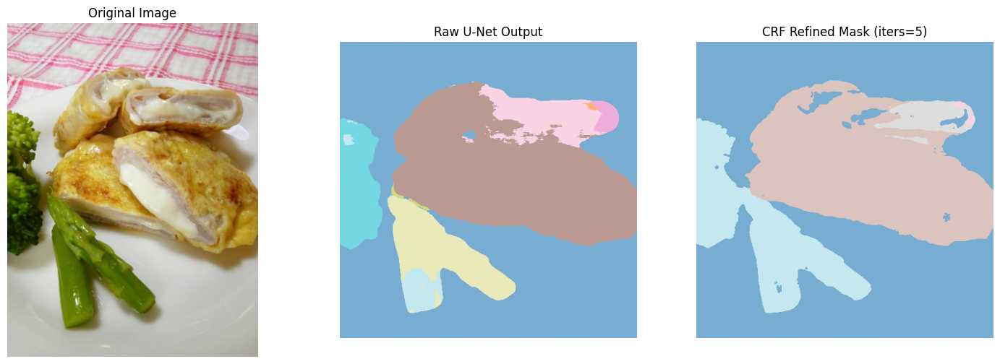

True food items:       ['chicken duck', 'asparagus', 'broccoli']
Predicted food items:  ['pie', 'chicken duck', 'asparagus', 'broccoli', 'bread']
Food accuracy (set-based): 60.00%
Pixel Accuracy: 93.81%
Mean IoU:       90.93%
Mean Dice:      95.20%
Avg. Hausdorff: 28.38 pixels



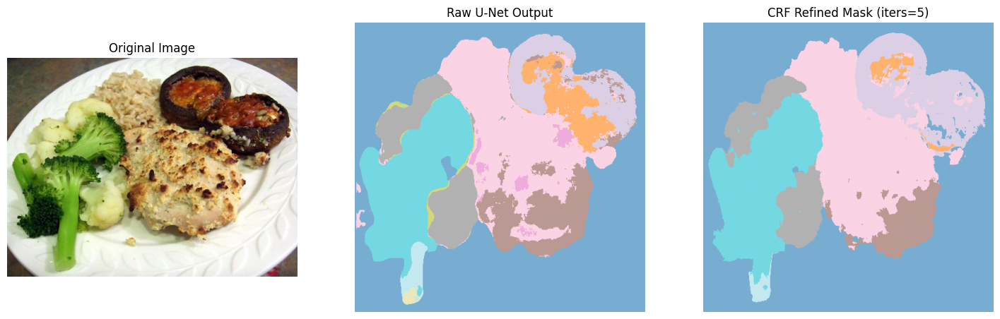

True food items:       ['rice', 'shiitake', 'cauliflower', 'chicken duck', 'broccoli']
Predicted food items:  ['French beans', 'rice', 'pie', 'potato', 'cake', 'steak', 'chicken duck', 'broccoli']
Food accuracy (set-based): 30.00%
Pixel Accuracy: 66.34%
Mean IoU:       47.40%
Mean Dice:      52.62%
Avg. Hausdorff: 68.89 pixels



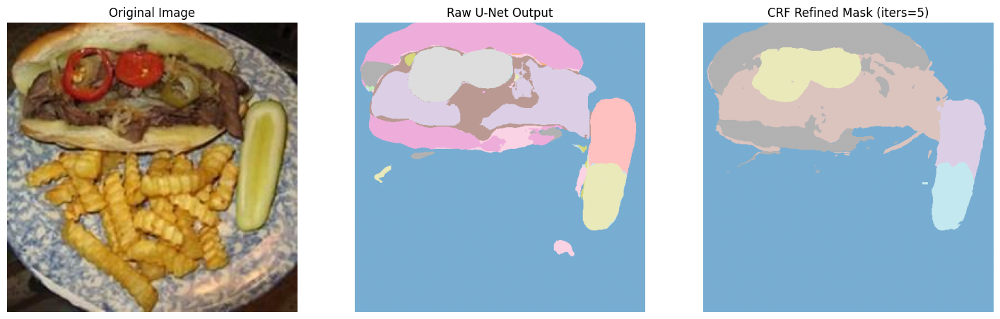

True food items:       ['french fries', 'tomato', 'steak', 'cucumber', 'bread', 'onion', 'pepper']
Predicted food items:  ['french fries', 'lemon', 'tomato', 'steak', 'chicken duck', 'lettuce', 'cucumber', 'bread']
Food accuracy (set-based): 50.00%
Pixel Accuracy: 81.76%
Mean IoU:       47.78%
Mean Dice:      56.67%
Avg. Hausdorff: 86.26 pixels



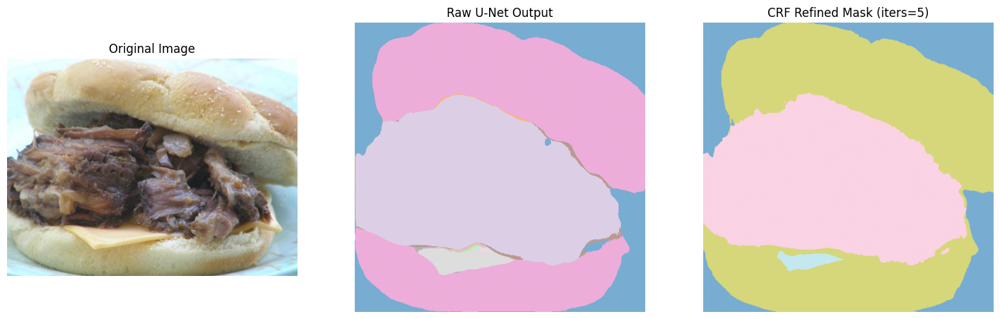

True food items:       ['cheese butter', 'bread', 'pork']
Predicted food items:  ['steak', 'bread', 'potato']
Food accuracy (set-based): 20.00%
Pixel Accuracy: 57.58%
Mean IoU:       46.46%
Mean Dice:      48.17%
Avg. Hausdorff: 51.89 pixels


Overall Segmentation Performance Metrics:
Avg. Pixel Accuracy:  72.82%
Avg. Mean IoU:        55.28%
Avg. Mean Dice:       60.33%
Avg. Hausdorff Dist.: 94.32 pixels

Average per-sample Food Accuracy (Jaccard): 40.20%

Classification Report (Presence/Absence for each food label):
                       precision    recall  f1-score   support

                candy       0.00      0.00      0.00        11
             egg tart       0.00      0.00      0.00         1
         french fries       0.34      0.88      0.50        78
            chocolate       0.00      0.00      0.00        18
              biscuit       0.32      0.66      0.43        77
              popcorn       0.00      0.00      0.00         4
              pudding       0.00   

In [7]:
import numpy as np
import pandas as pd
import io
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torchvision import transforms
from matplotlib.colors import ListedColormap
import torch.nn as nn
from pyarrow.parquet import ParquetFile
from scipy.spatial.distance import directed_hausdorff
import cv2
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_softmax, create_pairwise_gaussian, create_pairwise_bilateral
import concurrent.futures
from tqdm import tqdm
from sklearn.metrics import classification_report
import segmentation_models_pytorch as smp  # New: to load U-Net

############################################
# Hyperparameters and Settings
############################################
# Update image size to match U-Net training (512x512)
IMG_SIZE = (512, 512)
HYPERPARAMS = {
    "img_size": IMG_SIZE,
    "num_classes": 104,  # (0=background + 103 food items)
    "crf_iters": 5       # CRF iterations
}

# Load class mappings CSV.
class_mappings = pd.read_csv('/content/foodseg103/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

############################################
# Model Loading Function for U-Net
############################################
def load_model():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # Create a U-Net model with the same settings as your training code.
    model = smp.Unet(
        encoder_name="resnet50",
        encoder_weights="imagenet",
        in_channels=3,
        classes=HYPERPARAMS["num_classes"]
    )
    # Load the trained checkpoint (adjust the path as needed).
    checkpoint = torch.load("/content/foodseg103/best_unet_checkpoint.pth", map_location=device)
    model.load_state_dict(checkpoint["model_state_dict"], strict=False)
    model.to(device)
    model.eval()
    return model, device

############################################
# Image Transform
############################################
img_transform = transforms.Compose([
    transforms.Resize(HYPERPARAMS["img_size"]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

############################################
# Streaming Validation Batches Function
############################################
def stream_validation_batches(parquet_path, batch_size=16):
    pf = ParquetFile(parquet_path)
    batch_iter = pf.iter_batches(batch_size=1)  # one row per batch
    batch_images = []
    batch_img_tensors = []
    batch_gt_masks = []
    batch_np_images = []  # Pre-resized NumPy images for CRF refinement

    for batch in batch_iter:
        row = batch.to_pydict()
        img_bytes = row["image"][0]["bytes"]
        label_bytes = row["label"][0]["bytes"]
        img = Image.open(io.BytesIO(img_bytes)).convert("RGB")
        gt_mask = np.array(Image.open(io.BytesIO(label_bytes)).resize(HYPERPARAMS["img_size"], Image.NEAREST))
        img_tensor = img_transform(img)
        img_np = np.array(img.resize(HYPERPARAMS["img_size"], Image.BILINEAR))
        if img_np.ndim == 2:
            img_np = np.stack([img_np]*3, axis=-1)

        batch_images.append(img)
        batch_img_tensors.append(img_tensor)
        batch_gt_masks.append(gt_mask)
        batch_np_images.append(img_np)

        if len(batch_images) == batch_size:
            yield batch_images, torch.stack(batch_img_tensors), np.array(batch_gt_masks), batch_np_images
            batch_images, batch_img_tensors = [], []
            batch_gt_masks, batch_np_images = [], []

    if batch_images:
        yield batch_images, torch.stack(batch_img_tensors), np.array(batch_gt_masks), batch_np_images

############################################
# Metrics and Distance Functions
############################################
def compute_segmentation_metrics(pred, target, num_classes, ignore_bg=True):
    pred, target = pred.flatten(), target.flatten()
    pixel_acc = np.mean(pred == target)
    classes_to_eval = set(np.unique(target))
    if ignore_bg:
        classes_to_eval.discard(0)
    classes_to_eval = sorted(classes_to_eval)
    if not classes_to_eval:
        return pixel_acc, 1.0, 1.0
    iou_list, dice_list = [], []
    for cls in classes_to_eval:
        pred_inds, target_inds = (pred == cls), (target == cls)
        intersection = np.sum(pred_inds & target_inds)
        union = np.sum(pred_inds | target_inds)
        iou = intersection / union if union != 0 else 1.0
        dice = (2 * intersection) / (np.sum(pred_inds) + np.sum(target_inds) + 1e-8)
        iou_list.append(iou)
        dice_list.append(dice)
    return pixel_acc, np.mean(iou_list), np.mean(dice_list)

def hausdorff_distance_for_class(pred, target, cls):
    pred_points, target_points = np.argwhere(pred == cls), np.argwhere(target == cls)
    if pred_points.size == 0 or target_points.size == 0:
        return np.nan
    return max(directed_hausdorff(pred_points, target_points)[0],
               directed_hausdorff(target_points, pred_points)[0])

def compute_average_hausdorff(pred, target, num_classes):
    hd_list = [hausdorff_distance_for_class(pred, target, cls) for cls in range(1, num_classes)]
    valid_hd = [hd for hd in hd_list if not np.isnan(hd)]
    return np.nanmean(valid_hd) if valid_hd else np.nan

############################################
# CRF Refinement Function
############################################
def crf_refine(image, probs, num_iters=10):
    H, W = image.shape[:2]
    C = probs.shape[0]
    unary = unary_from_softmax(probs)
    unary = np.ascontiguousarray(unary)
    d = dcrf.DenseCRF2D(W, H, C)
    d.setUnaryEnergy(unary)
    feats_gaussian = create_pairwise_gaussian(sdims=(3, 3), shape=(H, W))
    d.addPairwiseEnergy(feats_gaussian, compat=6)
    feats_bilateral = create_pairwise_bilateral(sdims=(50, 50), schan=(13, 13, 13),
                                                img=image, chdim=2)
    d.addPairwiseEnergy(feats_bilateral, compat=15)
    Q = d.inference(num_iters)
    crf_result = np.argmax(Q, axis=0).reshape((H, W))
    return crf_result

############################################
# Main Function
############################################
def main():
    model, device = load_model()
    parquet_path = "/content/foodseg103/validation-00000-of-00001-a5bfdaa5beb7006a.parquet"
    batch_size = 16

    # Determine number of batches.
    pf = ParquetFile(parquet_path)
    total_rows = pf.metadata.num_rows
    total_batches = total_rows // batch_size + (1 if total_rows % batch_size != 0 else 0)

    cmap = ListedColormap(plt.cm.tab20.colors[:HYPERPARAMS["num_classes"]])
    overall_metrics = {"pixel_acc": [], "mean_iou": [], "mean_dice": [], "hausdorff": []}
    all_gt_vectors = []
    all_pred_vectors = []
    food_accuracy_list = []
    visualizations = []

    progress = tqdm(stream_validation_batches(parquet_path, batch_size=batch_size),
                    total=total_batches,
                    desc="Processing Batches")

    # Use ProcessPoolExecutor for parallel CRF processing.
    with concurrent.futures.ProcessPoolExecutor() as executor:
        for batch_images, img_tensors, gt_masks, batch_np_images in progress:
            img_tensors = img_tensors.to(device)
            with torch.no_grad():
                # For U-Net, the output is returned directly.
                outputs = model(img_tensors)
                raw_masks = outputs.argmax(dim=1).cpu().numpy()
                probs = torch.softmax(outputs, dim=1).cpu().numpy()

            current_batch = len(batch_images)
            crf_masks = [None] * current_batch

            # Submit CRF jobs in parallel.
            futures = {
                executor.submit(crf_refine, batch_np_images[i], probs[i],
                                num_iters=HYPERPARAMS["crf_iters"]): i
                for i in range(current_batch)
            }
            for future in concurrent.futures.as_completed(futures):
                i = futures[future]
                crf_masks[i] = future.result()

            # Evaluate predictions for each sample.
            for i in range(current_batch):
                raw_mask = raw_masks[i]
                refined_mask = crf_masks[i]
                gt_mask = gt_masks[i]

                pix_acc, mean_iou, mean_dice = compute_segmentation_metrics(
                    refined_mask, gt_mask, HYPERPARAMS["num_classes"], ignore_bg=False
                )
                avg_hausdorff = compute_average_hausdorff(
                    refined_mask, gt_mask, HYPERPARAMS["num_classes"]
                )

                overall_metrics["pixel_acc"].append(pix_acc)
                overall_metrics["mean_iou"].append(mean_iou)
                overall_metrics["mean_dice"].append(mean_dice)
                overall_metrics["hausdorff"].append(avg_hausdorff)

                # Get true and predicted food IDs (exclude background=0).
                true_ids = set(np.unique(gt_mask)) - {0}
                pred_ids = set(np.unique(refined_mask)) - {0}

                if len(true_ids) == 0 and len(pred_ids) == 0:
                    sample_food_accuracy = 1.0
                else:
                    intersection = len(true_ids & pred_ids)
                    union = len(true_ids | pred_ids)
                    sample_food_accuracy = intersection / union if union > 0 else 0.0
                food_accuracy_list.append(sample_food_accuracy)

                # Build binary vectors for multi-label classification.
                gt_vec = np.zeros(HYPERPARAMS["num_classes"] - 1, dtype=int)
                pred_vec = np.zeros(HYPERPARAMS["num_classes"] - 1, dtype=int)
                for lbl in true_ids:
                    if 1 <= lbl < HYPERPARAMS["num_classes"]:
                        gt_vec[lbl - 1] = 1
                for lbl in pred_ids:
                    if 1 <= lbl < HYPERPARAMS["num_classes"]:
                        pred_vec[lbl - 1] = 1
                all_gt_vectors.append(gt_vec)
                all_pred_vectors.append(pred_vec)

                # Collect visualizations for a few samples.
                if len(visualizations) < 25:
                    vis_info = {
                        "original": batch_images[i],
                        "raw_mask": raw_mask,
                        "refined_mask": refined_mask,
                        "true_ids": [id_to_food.get(fid, f"ID {fid}") for fid in true_ids],
                        "pred_ids": [id_to_food.get(fid, f"ID {fid}") for fid in pred_ids],
                        "pix_acc": pix_acc,
                        "mean_iou": mean_iou,
                        "mean_dice": mean_dice,
                        "hausdorff": avg_hausdorff,
                        "food_accuracy": sample_food_accuracy
                    }
                    visualizations.append(vis_info)

    # Display visualizations.
    for vis in visualizations:
        img_np = np.array(vis["original"]) / 255.0
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))
        ax[0].imshow(img_np)
        ax[0].set_title("Original Image")
        ax[1].imshow(vis["raw_mask"], cmap=cmap, alpha=0.6)
        ax[1].set_title("Raw U-Net Output")
        ax[2].imshow(vis["refined_mask"], cmap=cmap, alpha=0.6)
        ax[2].set_title(f"CRF Refined Mask (iters={HYPERPARAMS['crf_iters']})")
        for a in ax:
            a.axis("off")
        plt.show()

        print("True food items:      ", vis["true_ids"])
        print("Predicted food items: ", vis["pred_ids"])
        print(f"Food accuracy (set-based): {vis['food_accuracy']*100:.2f}%")
        print(f"Pixel Accuracy: {vis['pix_acc']*100:.2f}%")
        print(f"Mean IoU:       {vis['mean_iou']*100:.2f}%")
        print(f"Mean Dice:      {vis['mean_dice']*100:.2f}%")
        print(f"Avg. Hausdorff: {vis['hausdorff']:.2f} pixels\n")

    final_pixel_acc = np.mean(overall_metrics['pixel_acc']) * 100
    final_mean_iou = np.mean(overall_metrics['mean_iou']) * 100
    final_mean_dice = np.mean(overall_metrics['mean_dice']) * 100
    final_hausdorff = np.nanmean(overall_metrics['hausdorff'])

    print("\nOverall Segmentation Performance Metrics:")
    print(f"Avg. Pixel Accuracy:  {final_pixel_acc:.2f}%")
    print(f"Avg. Mean IoU:        {final_mean_iou:.2f}%")
    print(f"Avg. Mean Dice:       {final_mean_dice:.2f}%")
    print(f"Avg. Hausdorff Dist.: {final_hausdorff:.2f} pixels")

    mean_food_accuracy = np.mean(food_accuracy_list) * 100
    print(f"\nAverage per-sample Food Accuracy (Jaccard): {mean_food_accuracy:.2f}%")

    food_labels = [id_to_food[i] for i in range(1, HYPERPARAMS["num_classes"])]
    print("\nClassification Report (Presence/Absence for each food label):")
    print(classification_report(
        np.array(all_gt_vectors),
        np.array(all_pred_vectors),
        target_names=food_labels,
        zero_division=0
    ))

if __name__ == "__main__":
    main()


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 166MB/s]
<ipython-input-4-ee5cd547c940>:55: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded

Processing image: /content/SegTest.jpg


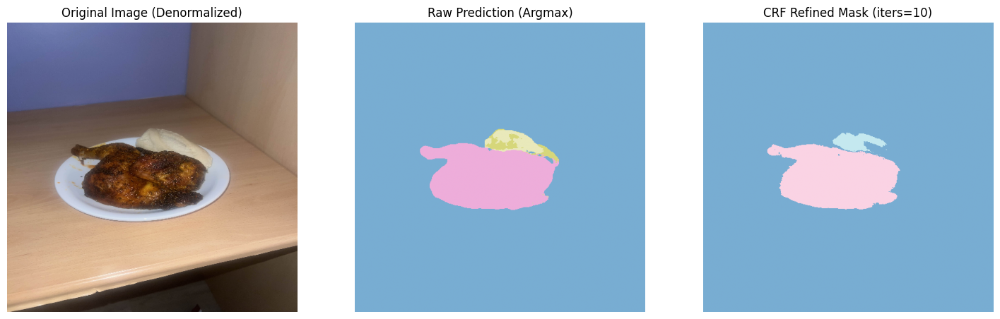

Predicted food labels: ['chicken duck', 'potato']

--------------------------------------------------

Processing image: /content/SegTest2.jpg


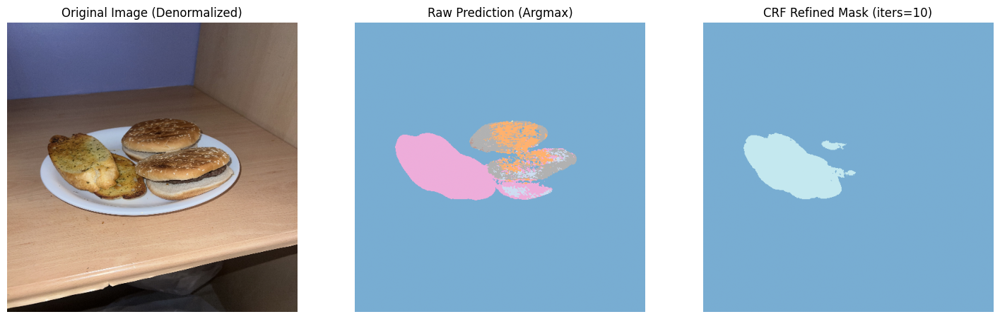

Predicted food labels: ['bread']

--------------------------------------------------



In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import cv2
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import create_pairwise_gaussian, create_pairwise_bilateral, softmax_to_unary
import segmentation_models_pytorch as smp
import albumentations as A
from albumentations.pytorch import ToTensorV2
from matplotlib.colors import ListedColormap
import pandas as pd

# -----------------------------
# Hyperparameters & Settings
# -----------------------------
HYPERPARAMS = {
    "num_classes": 104,        # 1 background + 103 foods
    "image_size": 512,         # must match your training transform
    "crf_iters": 10,
}
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# -----------------------------
# id_to_food Mapping
# -----------------------------
# (Assumes you have the CSV file with class mappings)
class_mappings = pd.read_csv('/content/class_mappings.csv')
id_to_food = dict(zip(class_mappings["Class Id"], class_mappings["Class Name"]))

# -----------------------------
# Inference Transform (Albumentations)
# -----------------------------
inference_transform = A.Compose([
    A.Resize(HYPERPARAMS["image_size"], HYPERPARAMS["image_size"]),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

# -----------------------------
# Model Loading for SMP Unet
# -----------------------------
def load_model():
    device = torch.device(DEVICE)
    model = smp.Unet(
        encoder_name="resnet50",
        encoder_weights="imagenet",
        in_channels=3,
        classes=HYPERPARAMS["num_classes"],
    )
    model.to(device)
    checkpoint = torch.load("best_unet_checkpoint.pth", map_location=device)
    if isinstance(checkpoint, dict) and "model_state_dict" in checkpoint:
        state_dict = checkpoint["model_state_dict"]
    else:
        state_dict = checkpoint
    model.load_state_dict(state_dict, strict=False)
    model.eval()
    return model, device

# -----------------------------
# CRF Refinement Function
# -----------------------------
def crf_refine(image, probs, num_iters=10):
    H, W = image.shape[:2]
    C = probs.shape[0]
    unary = softmax_to_unary(probs)  # shape: [C, H*W]
    unary = np.ascontiguousarray(unary)
    d = dcrf.DenseCRF2D(W, H, C)
    d.setUnaryEnergy(unary)
    feats_gaussian = create_pairwise_gaussian(sdims=(3, 3), shape=(H, W))
    d.addPairwiseEnergy(feats_gaussian, compat=6)
    feats_bilateral = create_pairwise_bilateral(sdims=(50, 50), schan=(13, 13, 13),
                                                img=image, chdim=2)
    d.addPairwiseEnergy(feats_bilateral, compat=15)
    Q = d.inference(num_iters)
    crf_result = np.argmax(Q, axis=0).reshape((H, W))
    return crf_result

# -----------------------------
# Process a Single Image
# -----------------------------
def process_unlabeled_image(image_path, model, device, transform):
    # Load image with PIL
    img = Image.open(image_path).convert("RGB")
    img_np = np.array(img)

    # Apply inference transform (Albumentations)
    augmented = transform(image=img_np)
    input_tensor = augmented["image"].unsqueeze(0).to(device)  # Shape: (1, C, H, W)

    with torch.no_grad():
        outputs = model(input_tensor)  # Shape: (1, num_classes, H, W)
        raw_pred_mask = outputs.argmax(dim=1).squeeze(0).cpu().numpy()  # (H, W)
        probs = torch.softmax(outputs, dim=1).squeeze(0).cpu().numpy()   # (num_classes, H, W)

    # Prepare image for CRF refinement: resize original image to inference size
    img_resized = np.array(img.resize((HYPERPARAMS["image_size"], HYPERPARAMS["image_size"]), Image.BILINEAR))
    if img_resized.ndim == 2:
        img_resized = np.stack([img_resized]*3, axis=-1)

    # Run CRF refinement
    crf_mask = crf_refine(img_resized, probs, num_iters=HYPERPARAMS["crf_iters"])

    return img, raw_pred_mask, crf_mask, input_tensor

# -----------------------------
# Main Function (Processing Multiple Images)
# -----------------------------
def main():
    # List of image paths to process
    image_paths = [
        "/content/SegTest.jpg",
        "/content/SegTest2.jpg",
        # Add more image paths as needed
    ]

    model, device = load_model()

    for image_path in image_paths:
        print(f"Processing image: {image_path}")
        img, raw_mask, refined_mask, input_tensor = process_unlabeled_image(image_path, model, device, inference_transform)

        # Denormalize image for display.
        # Reverse normalization: x = (x*std + mean)
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_tensor = input_tensor.squeeze(0).cpu().numpy()  # (C, H, W)
        img_denorm = (img_tensor.transpose(1, 2, 0) * std + mean)
        img_denorm = np.clip(img_denorm, 0, 1)

        # Get predicted food labels (assuming background is 0)
        unique_labels = np.unique(refined_mask)
        unique_labels = unique_labels[unique_labels != 0]
        predicted_foods = [id_to_food.get(int(label), f"ID {label}") for label in unique_labels]

        # Display the results.
        cmap = ListedColormap(plt.cm.tab20.colors[:HYPERPARAMS["num_classes"]])
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))
        ax[0].imshow(img_denorm)
        ax[0].set_title("Original Image (Denormalized)")
        ax[1].imshow(raw_mask, cmap=cmap, alpha=0.6)
        ax[1].set_title("Raw Prediction (Argmax)")
        ax[2].imshow(refined_mask, cmap=cmap, alpha=0.6)
        ax[2].set_title(f"CRF Refined Mask (iters={HYPERPARAMS['crf_iters']})")
        for a in ax:
            a.axis("off")
        plt.show()

        print("Predicted food labels:", predicted_foods)
        print("\n" + "-"*50 + "\n")

if __name__ == "__main__":
    main()
